# 1. Import the necessery libraries
*Importando bibliotecas necessárias*


In [1]:
import tensorflow as tf
import numpy as np
from enum import Enum
import pickle
from tqdm import tqdm

from tensorflow.keras.layers import Input
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import Dropout 
from tensorflow.keras.layers import Conv2DTranspose
from tensorflow.keras.layers import concatenate
from tensorflow.keras import regularizers


In [2]:
# DateTimeStamp para taggear arquivos e gerar "versionamento" para evitar sobrescritas

from datetime import datetime
fmtedDateTime = datetime.now().strftime('%Y%m%d%H%M%S')
print(fmtedDateTime)

20230624094818


# 2. Load and split the data
*Carga and quebra dos dados*


In [3]:
import os 
import numpy as np 
import pandas as pd 
import imageio 
import matplotlib.pyplot as plt 
%matplotlib inline 

path =''
image_path = os.path.join(path,'../input/semantic-drone-dataset/dataset/semantic_drone_dataset/original_images/')
mask_path = os.path.join(path,'../input/semantic-drone-dataset/dataset/semantic_drone_dataset/label_images_semantic/')
image_list = sorted(os.listdir(image_path))
mask_list = sorted(os.listdir(mask_path))
image_list = [image_path+i for i in image_list]
mask_list = [mask_path+i for i in mask_list]
image_list = sorted(image_list)
mask_list = sorted(mask_list)
train_image_list = image_list[:390]
train_mask_list = mask_list[:390]

validation_image_list = image_list[390:400]
validation_mask_list = mask_list[390:400]

print("number of train images is : {} ".format(len(train_image_list)))
print("number of train masks is : {} ".format(len(train_mask_list)))

print("number of train images is : {} ".format(len(validation_image_list)))
print("number of train masks is : {} ".format(len(validation_mask_list)))

print(image_list[0])
print(mask_list[0])

number of train images is : 390 
number of train masks is : 390 
number of train images is : 10 
number of train masks is : 10 
../input/semantic-drone-dataset/dataset/semantic_drone_dataset/original_images/000.jpg
../input/semantic-drone-dataset/dataset/semantic_drone_dataset/label_images_semantic/000.png


In [4]:
print("Number of samples:", len(image_list))

for input_path, target_path in zip(image_list[:10], mask_list[:10]):
    print(input_path, "|", target_path)

Number of samples: 400
../input/semantic-drone-dataset/dataset/semantic_drone_dataset/original_images/000.jpg | ../input/semantic-drone-dataset/dataset/semantic_drone_dataset/label_images_semantic/000.png
../input/semantic-drone-dataset/dataset/semantic_drone_dataset/original_images/001.jpg | ../input/semantic-drone-dataset/dataset/semantic_drone_dataset/label_images_semantic/001.png
../input/semantic-drone-dataset/dataset/semantic_drone_dataset/original_images/002.jpg | ../input/semantic-drone-dataset/dataset/semantic_drone_dataset/label_images_semantic/002.png
../input/semantic-drone-dataset/dataset/semantic_drone_dataset/original_images/003.jpg | ../input/semantic-drone-dataset/dataset/semantic_drone_dataset/label_images_semantic/003.png
../input/semantic-drone-dataset/dataset/semantic_drone_dataset/original_images/004.jpg | ../input/semantic-drone-dataset/dataset/semantic_drone_dataset/label_images_semantic/004.png
../input/semantic-drone-dataset/dataset/semantic_drone_dataset/orig

In [5]:
labels = pd.read_csv('../input/semantic-drone-dataset/class_dict_seg.csv')
labels

,name,r,g,b
0,unlabeled,0,0,0
1,paved-area,128,64,128
2,dirt,130,76,0
3,grass,0,102,0
4,gravel,112,103,87
5,water,28,42,168
6,rocks,48,41,30
7,pool,0,50,89
8,vegetation,107,142,35
9,roof,70,70,70


In [6]:
def print_label_colors():
    '''
    This method is just to print the label and their colors for reference
    '''
    for index,label in enumerate(labels.name):
        plt.subplot(6,4,index+1)
        (r,g,b)=labels.iloc[index].values[1:]
        img_ = np.array([[[r,g,b],[r,g,b],[r,g,b],[r,g,b]]])
        plt.title(label)
        plt.imshow(img_)
        plt.axis('off')

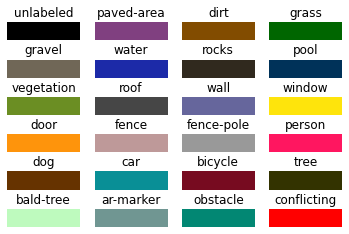

In [7]:
print_label_colors()

# 3. Explore some images
*Explorando algumas imagens do dataset*


(4000, 6000, 3)
(4000, 6000)


Text(0.5, 1.0, 'Mask')

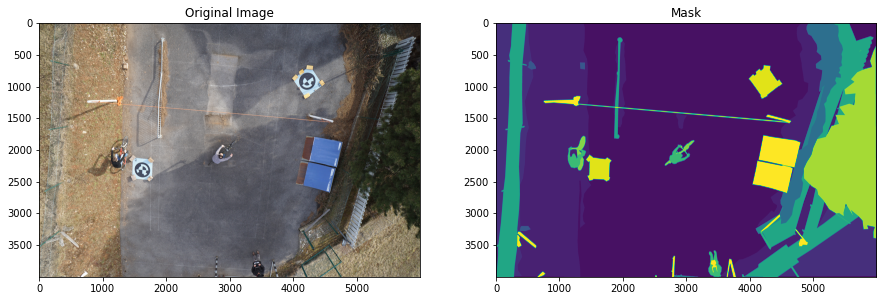

In [8]:
n = 10 # you can chose any index 
img  = imageio.imread(train_image_list[n])
print(img.shape)
mask = imageio.imread(train_mask_list[n])
print(mask.shape)

# now let's plot 
fig ,arr  = plt.subplots(1, 2, figsize=(15,10))
arr[0].imshow(img)
arr[0].set_title('Original Image')
arr[1].imshow(mask)
arr[1].set_title('Mask')

In [9]:
train_images = tf.constant(train_image_list)
train_masks = tf.constant(train_mask_list)

train_dataset = tf.data.Dataset.from_tensor_slices((train_images, train_masks))
for image, mask in train_dataset.take(1) : 
    print(image)
    print(mask)
    
validation_images = tf.constant(validation_image_list)
validation_masks = tf.constant(validation_mask_list)

validation_dataset = tf.data.Dataset.from_tensor_slices((validation_images, validation_masks))
for image, mask in validation_dataset.take(1) : 
    print(image)
    print(mask)    

tf.Tensor(b'../input/semantic-drone-dataset/dataset/semantic_drone_dataset/original_images/000.jpg', shape=(), dtype=string)
tf.Tensor(b'../input/semantic-drone-dataset/dataset/semantic_drone_dataset/label_images_semantic/000.png', shape=(), dtype=string)
tf.Tensor(b'../input/semantic-drone-dataset/dataset/semantic_drone_dataset/original_images/586.jpg', shape=(), dtype=string)
tf.Tensor(b'../input/semantic-drone-dataset/dataset/semantic_drone_dataset/label_images_semantic/586.png', shape=(), dtype=string)


# 4. Preprocessing our data
*Pre-processando nossos dados*


In [10]:
class MaskColorMap(Enum):
    unlabeled = (0,0,0)
    paved_area = (128,64,128)
    dirt = (130,76,0)
    grass = (0,102,0)
    gravel = (112,103,87)
    water = (28,42,168)
    rocks = (48,41,30)
    pool = (0,50,89)
    vegetation = (107,142,35)
    roof = (70,70,70)
    wall = (102,102,156)
    window = (254,228,12)
    door = (254,148,12)
    fence = (190,153,153)
    fence_pole = (153,153,153)
    person = (255,22,96)
    dog = (102,51,0)
    car = (9,143,150)
    bicycle = (119,11,32)
    tree = (51,51,0)
    bald_tree = (190,250,190)
    ar_marker = (112,150,146)
    obstacle = (2,135,115)
    conflicting = (255,0,0)
    
@tf.function
def one_hot_encode_masks(masks, num_classes):
    """
    :param masks: Y_train patched mask dataset
    :param num_classes: number of classes
    :return:
    """
    # initialise list for integer encoded masks
    integer_encoded_labels = []

    # iterate over each mask
    for mask in tqdm(masks):

        # get image shape
        _img_height, _img_width, _img_channels = mask.shape

        # create new mask of zeros
        encoded_image = np.zeros((_img_height, _img_width, 1)).astype(int)

        for j, cls in enumerate(MaskColorMap):
            encoded_image[np.all(mask == cls.value, axis=-1)] = j

        # append encoded image
        integer_encoded_labels.append(encoded_image)

    # return one-hot encoded labels
    return to_categorical(y=integer_encoded_labels, num_classes=num_classes)

In [11]:
def process_path(image_path, mask_path):
    img = tf.io.read_file(image_path)
    img = tf.image.decode_png(img,channels=3)
    img = tf.image.convert_image_dtype(img, tf.float32) #this do the same as dividing by 255 to set the values between 0 and 1 (normalization)
    
    mask = tf.io.read_file(mask_path)
    mask = tf.image.decode_png(mask,channels=3)
    mask = tf.math.reduce_max(mask, axis=-1, keepdims=True)

    return img, mask

def preprocess(image,mask) : 
    input_image = tf.image.resize(image,(96,128), method='nearest')
    input_mask = tf.image.resize(mask,(96,128), method='nearest')
    
    return input_image , input_mask

train_image_ds = train_dataset.map(process_path) # apply the preprocces_path function to our train_dataset
print(train_image_ds)
train_processed_image_ds = train_image_ds.map(preprocess) # apply the preprocess function to our train_dataset

validation_image_ds = validation_dataset.map(process_path) # apply the preprocces_path function to our validation_dataset
print(validation_image_ds)
validation_processed_image_ds = validation_image_ds.map(preprocess) 


<MapDataset shapes: ((None, None, 3), (None, None, 1)), types: (tf.float32, tf.uint8)>
<MapDataset shapes: ((None, None, 3), (None, None, 1)), types: (tf.float32, tf.uint8)>


# 5.  Define The Conv Block For The Contracting Path
*Definindo nosso Bloco de Convolução para o caminho de Contração (U-NET parte 1: Downsampling)*


In [12]:
def conv_block(inputs=None, n_filters=32, dropout_prob=0, max_pooling=True):
    
    conv = Conv2D(n_filters, 
                  kernel_size = 3,     
                  activation='relu',
                  padding='same',
                  kernel_initializer=tf.keras.initializers.HeNormal())(inputs)

    conv = Conv2D(n_filters, 
                  kernel_size = 3, 
                  activation='relu',
                  padding='same',
                  kernel_initializer=tf.keras.initializers.HeNormal())(conv)

    if dropout_prob > 0:
        conv = Dropout(dropout_prob)(conv)
        
    if max_pooling:
        next_layer = MaxPooling2D(pool_size=(2,2))(conv)

    else:
        next_layer = conv
        
    skip_connection = conv
    
    return next_layer, skip_connection

# 6. Define the upsampling block for the expanding path
*Definindo nosso Bloco de Upsampling para o caminho de Expansão (U-NET parte 2: Upsampling)*

In [13]:
def upsampling_block(expansive_input, contractive_input, n_filters=32):
    
    up = Conv2DTranspose(
                 n_filters,  
                 kernel_size = 3,
                 strides=(2,2),
                 padding='same')(expansive_input)
    
    merge = concatenate([up, contractive_input], axis=3)
    
    conv = Conv2D(n_filters,  
                 kernel_size = 3,   
                 activation='relu',
                 padding='same',
                 kernel_initializer=tf.keras.initializers.HeNormal())(merge)
    
    conv = Conv2D(n_filters,  
                 kernel_size = 3,  
                 activation='relu',
                 padding='same',
                 kernel_initializer=tf.keras.initializers.HeNormal())(conv)
    
    return conv

# 7. Build the U-NET model 
## Which composes of a set of conv blocks and upsampling blocks
*Construção do modelo U-NET*<br/>
*U-Net Parte1 + Parte2: Composição de blocos de convolução do caminho de Downsampling + blocos de Upsampling*

In [14]:
def build_unet_model(input_size=(96, 128, 3), n_filters=32, n_classes=23):
    
    inputs = Input(input_size)
    
    # contracting path
    cblock1 = conv_block(inputs, n_filters, dropout_prob=0.4)
    cblock2 = conv_block(cblock1[0], 2*n_filters, dropout_prob=0.4)
    cblock3 = conv_block(cblock2[0], 4*n_filters, dropout_prob=0.4)
    cblock4 = conv_block(cblock3[0], 8*n_filters, dropout_prob=0.45) 
    cblock5 = conv_block(cblock4[0],16*n_filters, dropout_prob=0.4, max_pooling=None)     
    
    # expanding path
    ublock6 = upsampling_block(cblock5[0], cblock4[1],  8 * n_filters)
    ublock7 = upsampling_block(ublock6, cblock3[1],  n_filters*4)
    ublock8 = upsampling_block(ublock7,cblock2[1] , n_filters*2)
    ublock9 = upsampling_block(ublock8,cblock1[1],  n_filters)

    conv9 = Conv2D(n_filters,
                 3,
                 activation='relu',
                 padding='same',
                 kernel_initializer='he_normal')(ublock9)
    
    conv10 = Conv2D(n_classes, kernel_size=1, padding='same')(conv9)  
    model = tf.keras.Model(inputs=inputs, outputs=conv10, name=f"{fmtedDateTime}_U-Net")

    return model

## 7.1 Object Model: materializing
*Materializando o modelo em um objeto*


In [15]:
img_height = 96
img_width = 128
num_channels = 3

unet = build_unet_model((img_height, img_width, num_channels))

In [16]:
from tensorflow.keras.preprocessing.image import array_to_img

def display(display_list):
    plt.figure(figsize=(20, 15))

    title = ['Input Image', 'True Mask', 'Predicted Mask']

    for i in range(len(display_list)):
        plt.subplot(1, len(display_list), i+1)
        plt.title(title[i])
        plt.imshow(array_to_img(display_list[i]))
        plt.axis('off')
    plt.show()

In [17]:
def create_mask(pred_mask):
    pred_mask = tf.argmax(pred_mask, axis=-1)
    pred_mask = pred_mask[..., tf.newaxis]
    return pred_mask[0]

def show_predictions(dataset=None, num=1):
    """
    Displays the first image of each of the num batches
    """
    if dataset:
        for image, mask in dataset.take(num):
            pred_mask = unet.predict(image)
            display([image[0], mask[0], create_mask(pred_mask)])

    else:
        display([sample_image, sample_mask,
             create_mask(unet.predict(sample_image[tf.newaxis, ...]))])

# 8. U-NET Model is ready !!

In [18]:
unet.summary()

Model: "20230624094818_U-Net"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 96, 128, 3)] 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 96, 128, 32)  896         input_1[0][0]                    
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 96, 128, 32)  9248        conv2d[0][0]                     
__________________________________________________________________________________________________
dropout (Dropout)               (None, 96, 128, 32)  0           conv2d_1[0][0]                   
_______________________________________________________________________________

In [19]:
unet.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

# 9. Callbacks e parciais de métrica de acurácia durante o treinamento
Fontes de estudo:
* Aulas BI_Master
* https://keras.io/guides/writing_your_own_callbacks/
* https://machinelearningmastery.com/check-point-deep-learning-models-keras/
* https://pyimagesearch.com/2021/06/30/how-to-use-the-modelcheckpoint-callback-with-keras-and-tensorflow/


In [20]:
from tensorflow.keras.callbacks import LearningRateScheduler
def scheduler(epoch, lr):
    if epoch < 10:
        return lr
    else:
        return lr * tf.math.exp(-0.1)

lr_callback = LearningRateScheduler(scheduler)

## 9.1 Model Checkpoint


In [21]:
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.callbacks import EarlyStopping
# Salvando apenas os pesos, logo, para se utilizar o modelo posteriormente,
# será preciso reconstruí-lo e carregar os pesos
checkpoint_filepath = f"/kaggle/working/{fmtedDateTime}_bestModelWeigths.h5"
model_checkpoint_callback = ModelCheckpoint(
    filepath=checkpoint_filepath,
    save_weights_only=True,
    monitor='val_accuracy',
    mode='max',
    save_best_only=True)


## 9.2 Early Stop


In [22]:
early_stop = EarlyStopping(monitor='val_accuracy', patience=50)

Funçao para apresentar as curvas de aprendizado durante o treino

In [23]:
def display_learning_curves(history):
    history = history
    acc = history.history["accuracy"]
    val_acc = history.history["val_accuracy"]

    loss = history.history["loss"]
    val_loss = history.history["val_loss"]

#     epochs_range = range(NUM_EPOCHS)

    fig = plt.figure(figsize=(30, 5))

    # summarize history for accuracy
    plt.subplot(1,2,1)
    plt.plot(acc, label="train accuracy")
    plt.plot(val_acc, label="validataion accuracy")
    plt.title('model accuracy')
    plt.ylabel('accuracy')
    plt.xlabel('epoch')
    plt.legend(['train', 'test'], loc='upper left')

    # summarize history for loss
    plt.subplot(1,2,2)
    plt.plot(loss, label="train loss")
    plt.plot(val_loss, label="validataion loss")
    plt.title('model loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train', 'test'], loc='upper left')
    plt.show()
    
    fig.tight_layout()
    plt.show()


Criando callback de visualização parcial das métricas e das inferências na validaçao durante o treino

In [24]:
from tensorflow.keras.callbacks import Callback

class DisplayCallback(Callback):
    def __init__(self, model):
        self.model = model
        
    def on_epoch_end(self, epoch, logs=None):
        if (epoch + 1) % 10 == 0:
            print("--------- partial results ---------")
            display_learning_curves(self.model.history)
            print("------- partial predictions -------")
            show_predictions(validation_dataset, 1)            

# 10. Trainning the Model

Epoch 1/500
25/25 [==============================] - 236s 344ms/step - loss: 2.6913 - accuracy: 0.2977 - val_loss: 2.2422 - val_accuracy: 0.3618
Epoch 2/500
25/25 [==============================] - 1s 43ms/step - loss: 2.1655 - accuracy: 0.3988 - val_loss: 2.0683 - val_accuracy: 0.4221
Epoch 3/500
25/25 [==============================] - 1s 44ms/step - loss: 1.9489 - accuracy: 0.4785 - val_loss: 1.8693 - val_accuracy: 0.4486
Epoch 4/500
25/25 [==============================] - 1s 43ms/step - loss: 1.7890 - accuracy: 0.5156 - val_loss: 1.8627 - val_accuracy: 0.4793
Epoch 5/500
25/25 [==============================] - 1s 46ms/step - loss: 1.7178 - accuracy: 0.5154 - val_loss: 1.6575 - val_accuracy: 0.4750
Epoch 6/500
25/25 [==============================] - 1s 44ms/step - loss: 1.6140 - accuracy: 0.5398 - val_loss: 1.6328 - val_accuracy: 0.4938
Epoch 7/500
25/25 [==============================] - 1s 43ms/step - loss: 1.5536 - accuracy: 0.5543 - val_loss: 1.5112 - val_accuracy: 0.5606
Epo

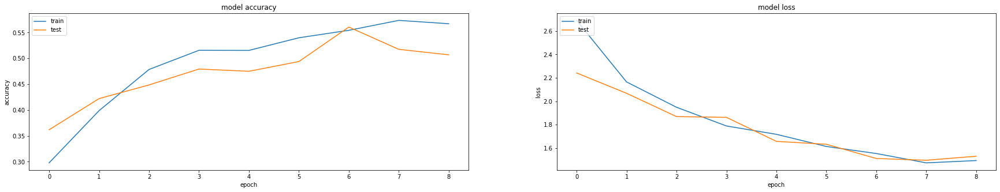

------- partial predictions -------


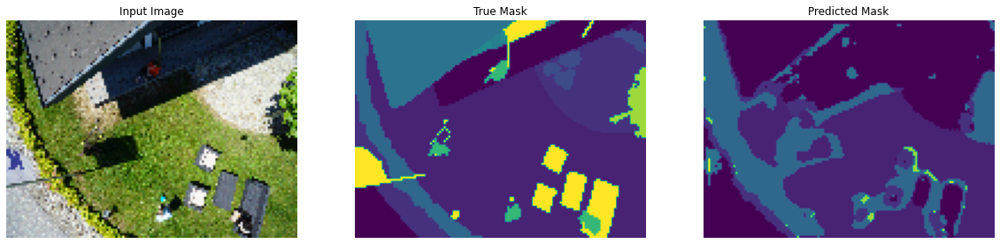

Epoch 11/500
25/25 [==============================] - 1s 43ms/step - loss: 1.3886 - accuracy: 0.5942 - val_loss: 1.3562 - val_accuracy: 0.5909
Epoch 12/500
25/25 [==============================] - 1s 43ms/step - loss: 1.3272 - accuracy: 0.6078 - val_loss: 1.2330 - val_accuracy: 0.6047
Epoch 13/500
25/25 [==============================] - 1s 43ms/step - loss: 1.3167 - accuracy: 0.6027 - val_loss: 1.4437 - val_accuracy: 0.5911
Epoch 14/500
25/25 [==============================] - 1s 43ms/step - loss: 1.3149 - accuracy: 0.6131 - val_loss: 1.1931 - val_accuracy: 0.6365
Epoch 15/500
25/25 [==============================] - 1s 43ms/step - loss: 1.2306 - accuracy: 0.6332 - val_loss: 1.1090 - val_accuracy: 0.6790
Epoch 16/500
25/25 [==============================] - 1s 43ms/step - loss: 1.1680 - accuracy: 0.6541 - val_loss: 1.0549 - val_accuracy: 0.6822
Epoch 17/500
25/25 [==============================] - 1s 43ms/step - loss: 1.1401 - accuracy: 0.6603 - val_loss: 1.1675 - val_accuracy: 0.6620

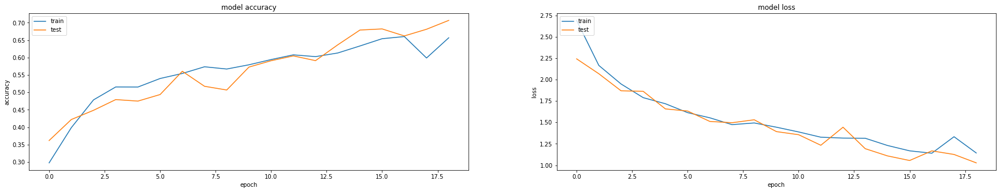

------- partial predictions -------


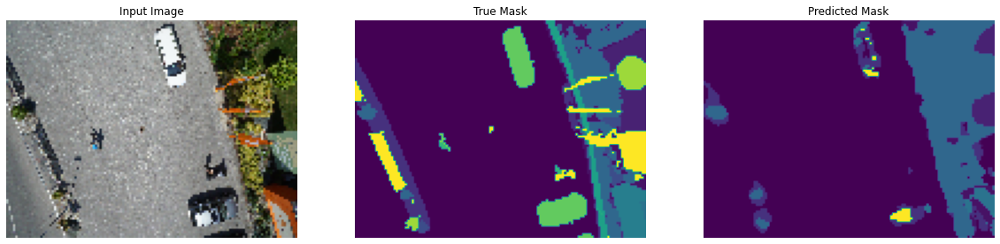

Epoch 21/500
25/25 [==============================] - 1s 42ms/step - loss: 1.1250 - accuracy: 0.6598 - val_loss: 1.0319 - val_accuracy: 0.7107
Epoch 22/500
25/25 [==============================] - 1s 43ms/step - loss: 1.0289 - accuracy: 0.6913 - val_loss: 1.0326 - val_accuracy: 0.7080
Epoch 23/500
25/25 [==============================] - 1s 43ms/step - loss: 1.0452 - accuracy: 0.6894 - val_loss: 0.9848 - val_accuracy: 0.6987
Epoch 24/500
25/25 [==============================] - 1s 43ms/step - loss: 1.0315 - accuracy: 0.6907 - val_loss: 0.9912 - val_accuracy: 0.6969
Epoch 25/500
25/25 [==============================] - 1s 43ms/step - loss: 1.0289 - accuracy: 0.6879 - val_loss: 0.9852 - val_accuracy: 0.7331
Epoch 26/500
25/25 [==============================] - 1s 43ms/step - loss: 0.9843 - accuracy: 0.7022 - val_loss: 0.9222 - val_accuracy: 0.7258
Epoch 27/500
25/25 [==============================] - 1s 44ms/step - loss: 0.9673 - accuracy: 0.7083 - val_loss: 0.9472 - val_accuracy: 0.7277

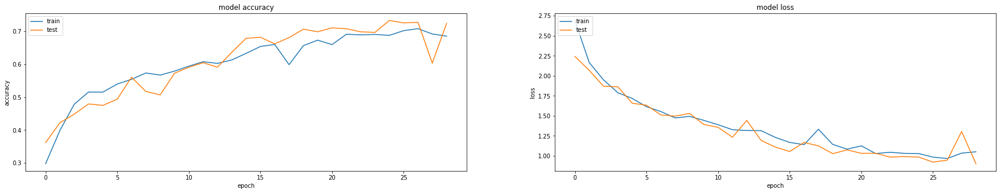

------- partial predictions -------


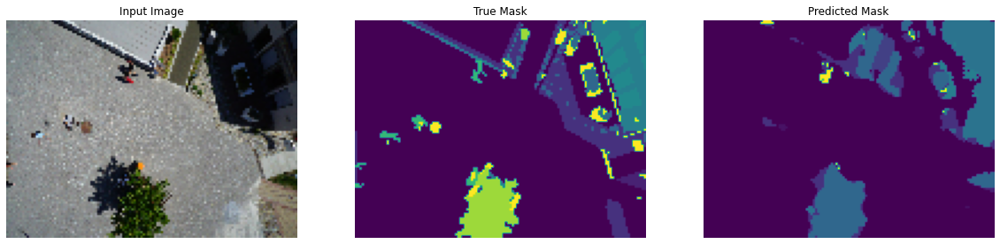

Epoch 31/500
25/25 [==============================] - 1s 43ms/step - loss: 0.9261 - accuracy: 0.7177 - val_loss: 0.8267 - val_accuracy: 0.7430
Epoch 32/500
25/25 [==============================] - 1s 43ms/step - loss: 0.8786 - accuracy: 0.7330 - val_loss: 0.8654 - val_accuracy: 0.7392
Epoch 33/500
25/25 [==============================] - 1s 43ms/step - loss: 0.8630 - accuracy: 0.7385 - val_loss: 0.8844 - val_accuracy: 0.7402
Epoch 34/500
25/25 [==============================] - 1s 43ms/step - loss: 0.8480 - accuracy: 0.7416 - val_loss: 0.9281 - val_accuracy: 0.7448
Epoch 35/500
25/25 [==============================] - 1s 43ms/step - loss: 0.9877 - accuracy: 0.7017 - val_loss: 0.8374 - val_accuracy: 0.7444
Epoch 36/500
25/25 [==============================] - 1s 43ms/step - loss: 0.8667 - accuracy: 0.7364 - val_loss: 0.8032 - val_accuracy: 0.7544
Epoch 37/500
25/25 [==============================] - 1s 43ms/step - loss: 0.8067 - accuracy: 0.7546 - val_loss: 0.7994 - val_accuracy: 0.7529

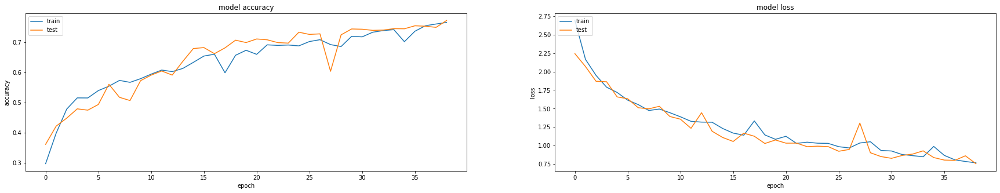

------- partial predictions -------


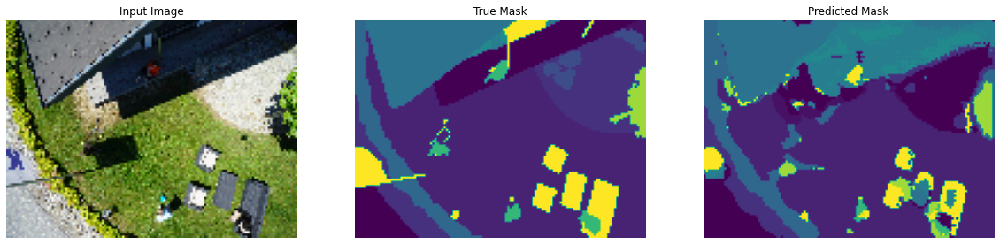

Epoch 41/500
25/25 [==============================] - 1s 43ms/step - loss: 0.7283 - accuracy: 0.7774 - val_loss: 0.8137 - val_accuracy: 0.7471
Epoch 42/500
25/25 [==============================] - 1s 43ms/step - loss: 0.7195 - accuracy: 0.7777 - val_loss: 0.8313 - val_accuracy: 0.7331
Epoch 43/500
25/25 [==============================] - 1s 43ms/step - loss: 0.7453 - accuracy: 0.7707 - val_loss: 0.7428 - val_accuracy: 0.7711
Epoch 44/500
25/25 [==============================] - 1s 43ms/step - loss: 0.6819 - accuracy: 0.7890 - val_loss: 0.6949 - val_accuracy: 0.7845
Epoch 45/500
25/25 [==============================] - 1s 43ms/step - loss: 0.6638 - accuracy: 0.7943 - val_loss: 0.7859 - val_accuracy: 0.7647
Epoch 46/500
25/25 [==============================] - 1s 44ms/step - loss: 0.6835 - accuracy: 0.7900 - val_loss: 0.6658 - val_accuracy: 0.7890
Epoch 47/500
25/25 [==============================] - 1s 43ms/step - loss: 0.6784 - accuracy: 0.7894 - val_loss: 0.8326 - val_accuracy: 0.7433

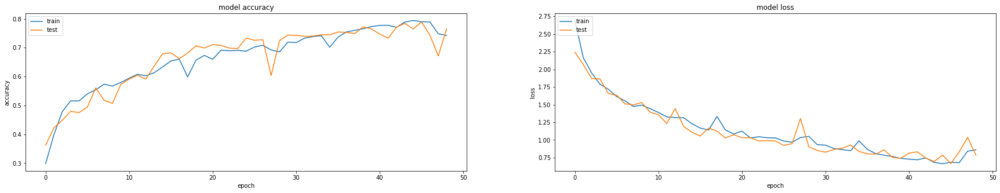

------- partial predictions -------


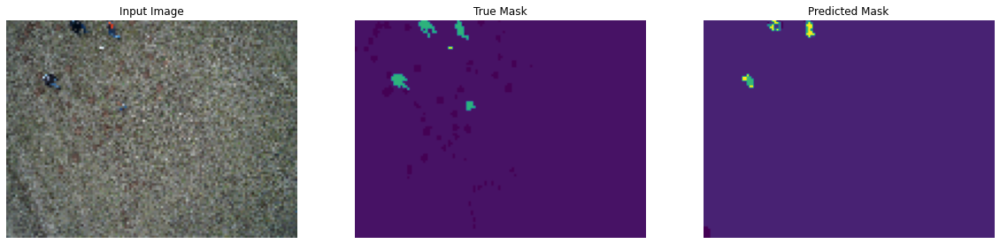

Epoch 51/500
25/25 [==============================] - 1s 43ms/step - loss: 0.6687 - accuracy: 0.7930 - val_loss: 0.7043 - val_accuracy: 0.7738
Epoch 52/500
25/25 [==============================] - 1s 43ms/step - loss: 0.6406 - accuracy: 0.8009 - val_loss: 0.6926 - val_accuracy: 0.7846
Epoch 53/500
25/25 [==============================] - 1s 43ms/step - loss: 0.6271 - accuracy: 0.8056 - val_loss: 0.6497 - val_accuracy: 0.7968
Epoch 54/500
25/25 [==============================] - 1s 43ms/step - loss: 0.6094 - accuracy: 0.8108 - val_loss: 0.6303 - val_accuracy: 0.8012
Epoch 55/500
25/25 [==============================] - 1s 43ms/step - loss: 0.6018 - accuracy: 0.8121 - val_loss: 0.6240 - val_accuracy: 0.8009
Epoch 56/500
25/25 [==============================] - 1s 43ms/step - loss: 0.6006 - accuracy: 0.8124 - val_loss: 0.6361 - val_accuracy: 0.8026
Epoch 57/500
25/25 [==============================] - 1s 43ms/step - loss: 0.5756 - accuracy: 0.8205 - val_loss: 0.6292 - val_accuracy: 0.7997

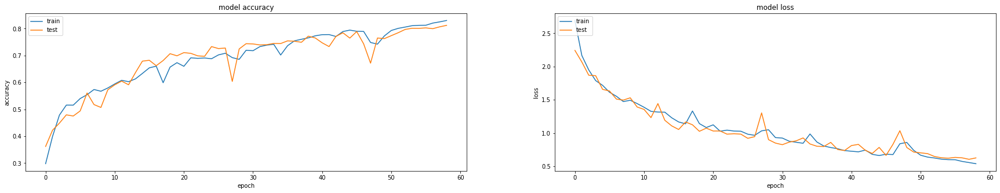

------- partial predictions -------


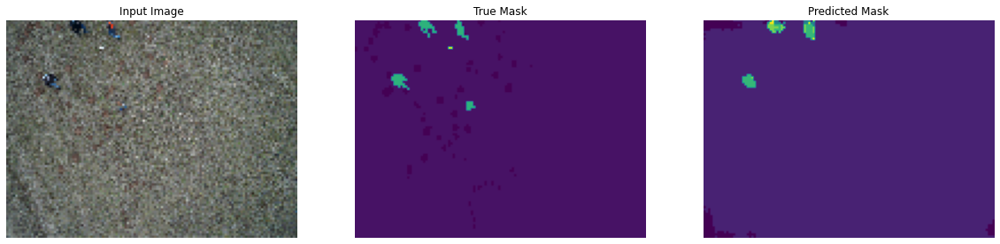

Epoch 61/500
25/25 [==============================] - 1s 44ms/step - loss: 0.5571 - accuracy: 0.8253 - val_loss: 0.5921 - val_accuracy: 0.8065
Epoch 62/500
25/25 [==============================] - 1s 43ms/step - loss: 0.5197 - accuracy: 0.8362 - val_loss: 0.5735 - val_accuracy: 0.8163
Epoch 63/500
25/25 [==============================] - 1s 43ms/step - loss: 0.5080 - accuracy: 0.8393 - val_loss: 0.5800 - val_accuracy: 0.8153
Epoch 64/500
25/25 [==============================] - 1s 43ms/step - loss: 0.4965 - accuracy: 0.8429 - val_loss: 0.5533 - val_accuracy: 0.8250
Epoch 65/500
25/25 [==============================] - 1s 43ms/step - loss: 0.4930 - accuracy: 0.8442 - val_loss: 0.5454 - val_accuracy: 0.8244
Epoch 66/500
25/25 [==============================] - 1s 43ms/step - loss: 0.4830 - accuracy: 0.8475 - val_loss: 0.5796 - val_accuracy: 0.8223
Epoch 67/500
25/25 [==============================] - 1s 43ms/step - loss: 0.4757 - accuracy: 0.8493 - val_loss: 0.5937 - val_accuracy: 0.8200

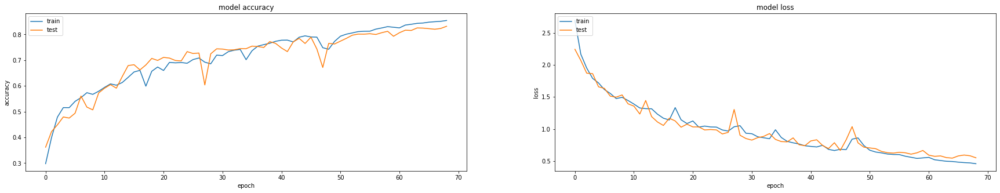

------- partial predictions -------


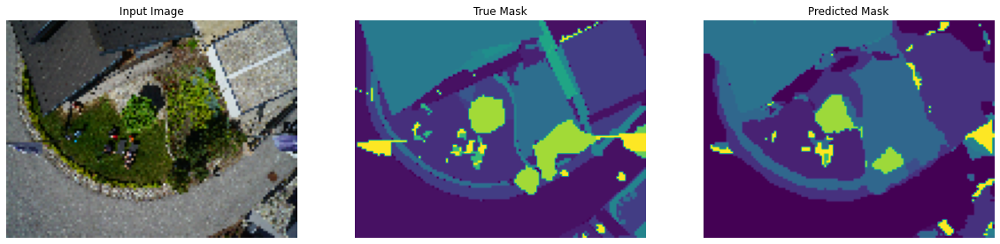

Epoch 71/500
25/25 [==============================] - 1s 43ms/step - loss: 0.4647 - accuracy: 0.8520 - val_loss: 0.5566 - val_accuracy: 0.8261
Epoch 72/500
25/25 [==============================] - 1s 43ms/step - loss: 0.4672 - accuracy: 0.8523 - val_loss: 0.5151 - val_accuracy: 0.8421
Epoch 73/500
25/25 [==============================] - 1s 43ms/step - loss: 0.4546 - accuracy: 0.8550 - val_loss: 0.5336 - val_accuracy: 0.8357
Epoch 74/500
25/25 [==============================] - 1s 45ms/step - loss: 0.4393 - accuracy: 0.8596 - val_loss: 0.5551 - val_accuracy: 0.8304
Epoch 75/500
25/25 [==============================] - 1s 43ms/step - loss: 0.4375 - accuracy: 0.8601 - val_loss: 0.5430 - val_accuracy: 0.8324
Epoch 76/500
25/25 [==============================] - 1s 44ms/step - loss: 0.4477 - accuracy: 0.8578 - val_loss: 0.5734 - val_accuracy: 0.8281
Epoch 77/500
25/25 [==============================] - 1s 43ms/step - loss: 0.4497 - accuracy: 0.8565 - val_loss: 0.5436 - val_accuracy: 0.8365

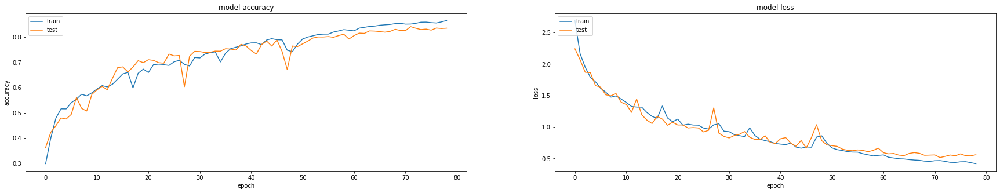

------- partial predictions -------


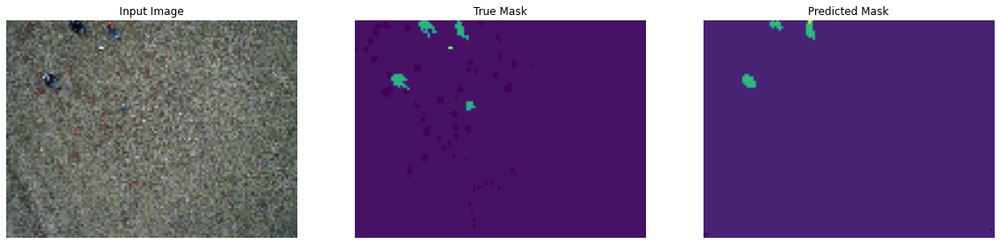

Epoch 81/500
25/25 [==============================] - 1s 43ms/step - loss: 0.4025 - accuracy: 0.8705 - val_loss: 0.5466 - val_accuracy: 0.8370
Epoch 82/500
25/25 [==============================] - 1s 43ms/step - loss: 0.3994 - accuracy: 0.8718 - val_loss: 0.5541 - val_accuracy: 0.8370
Epoch 83/500
25/25 [==============================] - 1s 43ms/step - loss: 0.3939 - accuracy: 0.8734 - val_loss: 0.5285 - val_accuracy: 0.8392
Epoch 84/500
25/25 [==============================] - 1s 43ms/step - loss: 0.3852 - accuracy: 0.8764 - val_loss: 0.5079 - val_accuracy: 0.8426
Epoch 85/500
25/25 [==============================] - 1s 44ms/step - loss: 0.3851 - accuracy: 0.8761 - val_loss: 0.5307 - val_accuracy: 0.8389
Epoch 86/500
25/25 [==============================] - 1s 43ms/step - loss: 0.3946 - accuracy: 0.8746 - val_loss: 0.6300 - val_accuracy: 0.8110
Epoch 87/500
25/25 [==============================] - 1s 43ms/step - loss: 0.4753 - accuracy: 0.8491 - val_loss: 0.5792 - val_accuracy: 0.8270

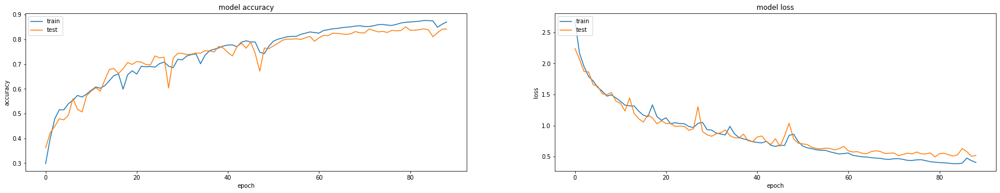

------- partial predictions -------


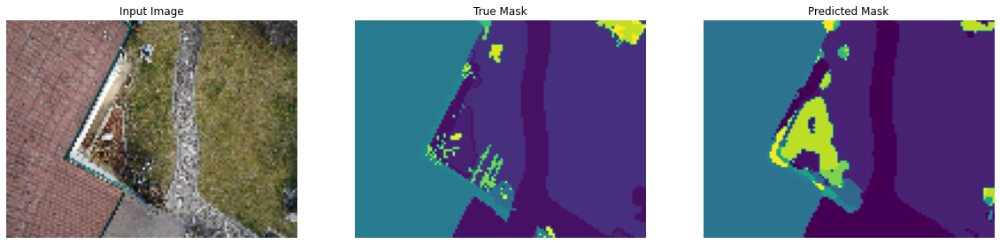

Epoch 91/500
25/25 [==============================] - 1s 43ms/step - loss: 0.3810 - accuracy: 0.8773 - val_loss: 0.4837 - val_accuracy: 0.8524
Epoch 92/500
25/25 [==============================] - 1s 44ms/step - loss: 0.3660 - accuracy: 0.8821 - val_loss: 0.5262 - val_accuracy: 0.8447
Epoch 93/500
25/25 [==============================] - 1s 43ms/step - loss: 0.3580 - accuracy: 0.8842 - val_loss: 0.4993 - val_accuracy: 0.8486
Epoch 94/500
25/25 [==============================] - 1s 43ms/step - loss: 0.3539 - accuracy: 0.8849 - val_loss: 0.5326 - val_accuracy: 0.8421
Epoch 95/500
25/25 [==============================] - 1s 43ms/step - loss: 0.3507 - accuracy: 0.8861 - val_loss: 0.5387 - val_accuracy: 0.8454
Epoch 96/500
25/25 [==============================] - 1s 43ms/step - loss: 0.3469 - accuracy: 0.8873 - val_loss: 0.5358 - val_accuracy: 0.8447
Epoch 97/500
25/25 [==============================] - 1s 43ms/step - loss: 0.3451 - accuracy: 0.8881 - val_loss: 0.5526 - val_accuracy: 0.8415

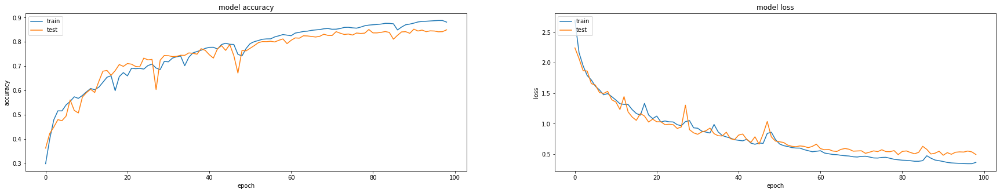

------- partial predictions -------


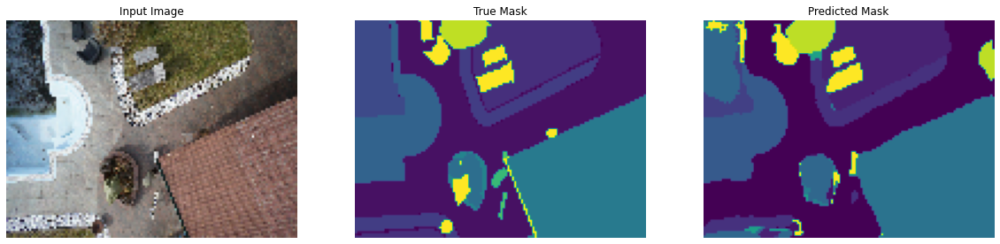

Epoch 101/500
25/25 [==============================] - 1s 43ms/step - loss: 0.3502 - accuracy: 0.8861 - val_loss: 0.5430 - val_accuracy: 0.8400
Epoch 102/500
25/25 [==============================] - 1s 43ms/step - loss: 0.5151 - accuracy: 0.8406 - val_loss: 0.7391 - val_accuracy: 0.7961
Epoch 103/500
25/25 [==============================] - 1s 43ms/step - loss: 0.5822 - accuracy: 0.8209 - val_loss: 0.8190 - val_accuracy: 0.7312
Epoch 104/500
25/25 [==============================] - 1s 43ms/step - loss: 0.5688 - accuracy: 0.8227 - val_loss: 0.5820 - val_accuracy: 0.8205
Epoch 105/500
25/25 [==============================] - 1s 43ms/step - loss: 0.4626 - accuracy: 0.8536 - val_loss: 0.5329 - val_accuracy: 0.8409
Epoch 106/500
25/25 [==============================] - 1s 43ms/step - loss: 0.3932 - accuracy: 0.8739 - val_loss: 0.4938 - val_accuracy: 0.8522
Epoch 107/500
25/25 [==============================] - 1s 43ms/step - loss: 0.3600 - accuracy: 0.8836 - val_loss: 0.5060 - val_accuracy:

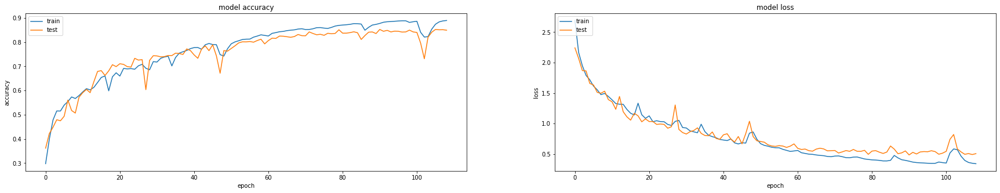

------- partial predictions -------


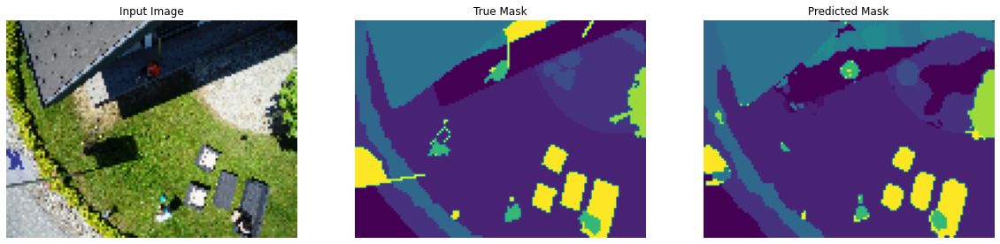

Epoch 111/500
25/25 [==============================] - 1s 43ms/step - loss: 0.3253 - accuracy: 0.8939 - val_loss: 0.5040 - val_accuracy: 0.8519
Epoch 112/500
25/25 [==============================] - 1s 43ms/step - loss: 0.3202 - accuracy: 0.8956 - val_loss: 0.5041 - val_accuracy: 0.8533
Epoch 113/500
25/25 [==============================] - 1s 43ms/step - loss: 0.3159 - accuracy: 0.8969 - val_loss: 0.5195 - val_accuracy: 0.8500
Epoch 114/500
25/25 [==============================] - 1s 43ms/step - loss: 0.3111 - accuracy: 0.8980 - val_loss: 0.4794 - val_accuracy: 0.8580
Epoch 115/500
25/25 [==============================] - 1s 44ms/step - loss: 0.3120 - accuracy: 0.8977 - val_loss: 0.5314 - val_accuracy: 0.8454
Epoch 116/500
25/25 [==============================] - 1s 43ms/step - loss: 0.3086 - accuracy: 0.8985 - val_loss: 0.4955 - val_accuracy: 0.8538
Epoch 117/500
25/25 [==============================] - 1s 43ms/step - loss: 0.3054 - accuracy: 0.8995 - val_loss: 0.5243 - val_accuracy:

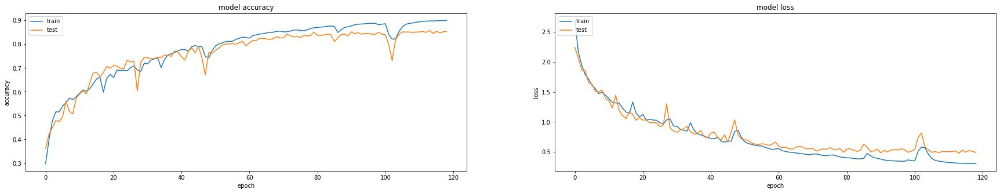

------- partial predictions -------


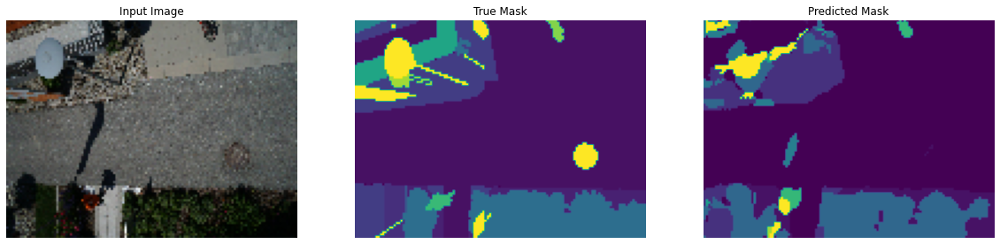

Epoch 121/500
25/25 [==============================] - 1s 43ms/step - loss: 0.2983 - accuracy: 0.9015 - val_loss: 0.4980 - val_accuracy: 0.8570
Epoch 122/500
25/25 [==============================] - 1s 43ms/step - loss: 0.2969 - accuracy: 0.9019 - val_loss: 0.4695 - val_accuracy: 0.8596
Epoch 123/500
25/25 [==============================] - 1s 46ms/step - loss: 0.2969 - accuracy: 0.9021 - val_loss: 0.4875 - val_accuracy: 0.8594
Epoch 124/500
25/25 [==============================] - 1s 43ms/step - loss: 0.2946 - accuracy: 0.9027 - val_loss: 0.5010 - val_accuracy: 0.8541
Epoch 125/500
25/25 [==============================] - 1s 43ms/step - loss: 0.2917 - accuracy: 0.9034 - val_loss: 0.4711 - val_accuracy: 0.8592
Epoch 126/500
25/25 [==============================] - 1s 43ms/step - loss: 0.2888 - accuracy: 0.9044 - val_loss: 0.5008 - val_accuracy: 0.8541
Epoch 127/500
25/25 [==============================] - 1s 43ms/step - loss: 0.2914 - accuracy: 0.9036 - val_loss: 0.4768 - val_accuracy:

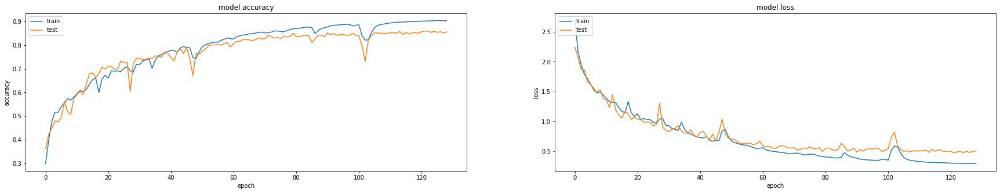

------- partial predictions -------


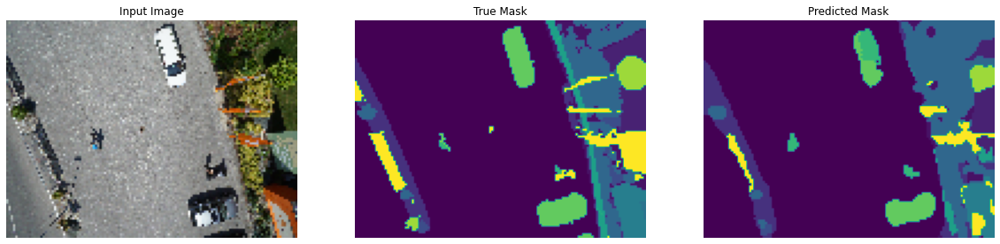

Epoch 131/500
25/25 [==============================] - 1s 43ms/step - loss: 0.2833 - accuracy: 0.9060 - val_loss: 0.4942 - val_accuracy: 0.8544
Epoch 132/500
25/25 [==============================] - 1s 43ms/step - loss: 0.2873 - accuracy: 0.9047 - val_loss: 0.4998 - val_accuracy: 0.8514
Epoch 133/500
25/25 [==============================] - 1s 44ms/step - loss: 0.2923 - accuracy: 0.9027 - val_loss: 0.5665 - val_accuracy: 0.8469
Epoch 134/500
25/25 [==============================] - 1s 43ms/step - loss: 0.2973 - accuracy: 0.9015 - val_loss: 0.4590 - val_accuracy: 0.8596
Epoch 135/500
25/25 [==============================] - 1s 43ms/step - loss: 0.3215 - accuracy: 0.8942 - val_loss: 0.4955 - val_accuracy: 0.8554
Epoch 136/500
25/25 [==============================] - 1s 43ms/step - loss: 0.2999 - accuracy: 0.9003 - val_loss: 0.4919 - val_accuracy: 0.8551
Epoch 137/500
25/25 [==============================] - 1s 43ms/step - loss: 0.2839 - accuracy: 0.9055 - val_loss: 0.5096 - val_accuracy:

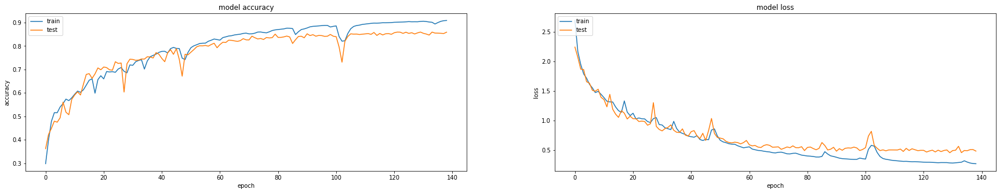

------- partial predictions -------


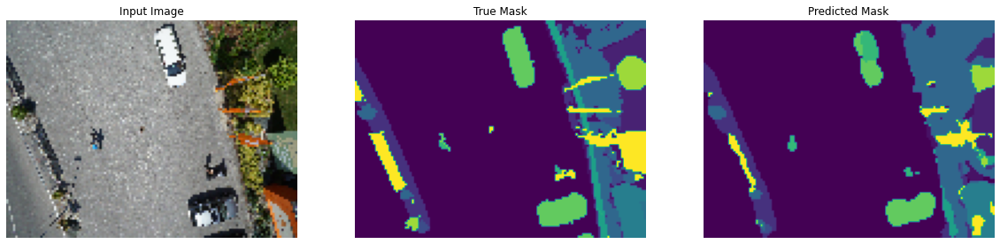

Epoch 141/500
25/25 [==============================] - 1s 43ms/step - loss: 0.2700 - accuracy: 0.9099 - val_loss: 0.5512 - val_accuracy: 0.8509
Epoch 142/500
25/25 [==============================] - 1s 43ms/step - loss: 0.2734 - accuracy: 0.9089 - val_loss: 0.4901 - val_accuracy: 0.8604
Epoch 143/500
25/25 [==============================] - 1s 42ms/step - loss: 0.2688 - accuracy: 0.9099 - val_loss: 0.5170 - val_accuracy: 0.8569
Epoch 144/500
25/25 [==============================] - 1s 42ms/step - loss: 0.2685 - accuracy: 0.9099 - val_loss: 0.5304 - val_accuracy: 0.8492
Epoch 145/500
25/25 [==============================] - 1s 43ms/step - loss: 0.2678 - accuracy: 0.9104 - val_loss: 0.5012 - val_accuracy: 0.8573
Epoch 146/500
25/25 [==============================] - 1s 43ms/step - loss: 0.2657 - accuracy: 0.9106 - val_loss: 0.4923 - val_accuracy: 0.8576
Epoch 147/500
25/25 [==============================] - 1s 43ms/step - loss: 0.2642 - accuracy: 0.9111 - val_loss: 0.4926 - val_accuracy:

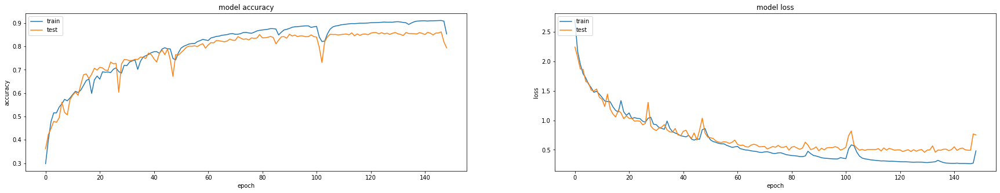

------- partial predictions -------


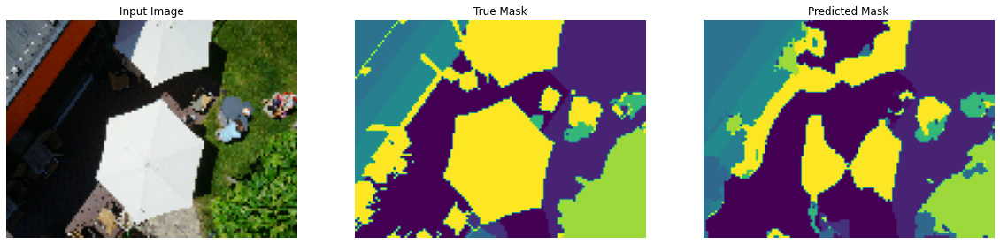

Epoch 151/500
25/25 [==============================] - 1s 43ms/step - loss: 0.3959 - accuracy: 0.8724 - val_loss: 0.5004 - val_accuracy: 0.8534
Epoch 152/500
25/25 [==============================] - 1s 43ms/step - loss: 0.3183 - accuracy: 0.8955 - val_loss: 0.5037 - val_accuracy: 0.8542
Epoch 153/500
25/25 [==============================] - 1s 43ms/step - loss: 0.2903 - accuracy: 0.9038 - val_loss: 0.4930 - val_accuracy: 0.8596
Epoch 154/500
25/25 [==============================] - 1s 43ms/step - loss: 0.2773 - accuracy: 0.9077 - val_loss: 0.4707 - val_accuracy: 0.8633
Epoch 155/500
25/25 [==============================] - 1s 43ms/step - loss: 0.2689 - accuracy: 0.9099 - val_loss: 0.4612 - val_accuracy: 0.8655
Epoch 156/500
25/25 [==============================] - 1s 43ms/step - loss: 0.2666 - accuracy: 0.9105 - val_loss: 0.4731 - val_accuracy: 0.8627
Epoch 157/500
25/25 [==============================] - 1s 43ms/step - loss: 0.2636 - accuracy: 0.9117 - val_loss: 0.4670 - val_accuracy:

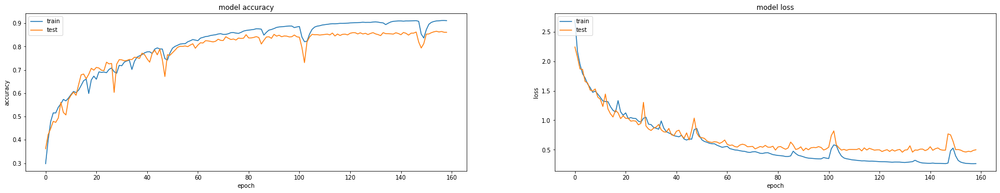

------- partial predictions -------


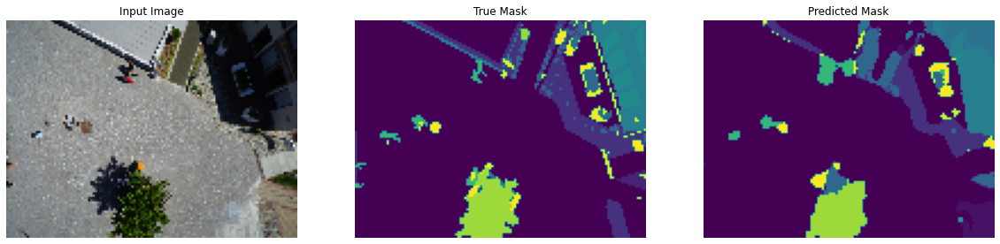

Epoch 161/500
25/25 [==============================] - 1s 43ms/step - loss: 0.2550 - accuracy: 0.9142 - val_loss: 0.4675 - val_accuracy: 0.8655
Epoch 162/500
25/25 [==============================] - 1s 43ms/step - loss: 0.2547 - accuracy: 0.9144 - val_loss: 0.4808 - val_accuracy: 0.8647
Epoch 163/500
25/25 [==============================] - 1s 43ms/step - loss: 0.2571 - accuracy: 0.9136 - val_loss: 0.4549 - val_accuracy: 0.8630
Epoch 164/500
25/25 [==============================] - 1s 43ms/step - loss: 0.2544 - accuracy: 0.9142 - val_loss: 0.4862 - val_accuracy: 0.8647
Epoch 165/500
25/25 [==============================] - 1s 43ms/step - loss: 0.2472 - accuracy: 0.9163 - val_loss: 0.5092 - val_accuracy: 0.8595
Epoch 166/500
25/25 [==============================] - 1s 43ms/step - loss: 0.2476 - accuracy: 0.9162 - val_loss: 0.4919 - val_accuracy: 0.8598
Epoch 167/500
25/25 [==============================] - 1s 43ms/step - loss: 0.2495 - accuracy: 0.9154 - val_loss: 0.4952 - val_accuracy:

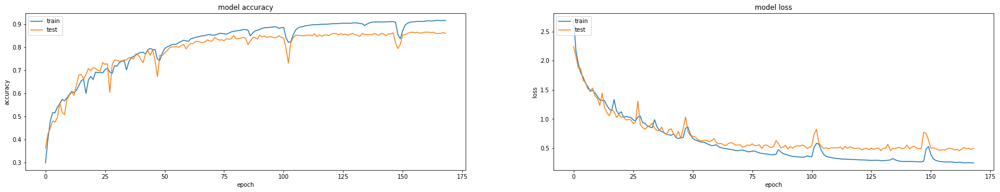

------- partial predictions -------


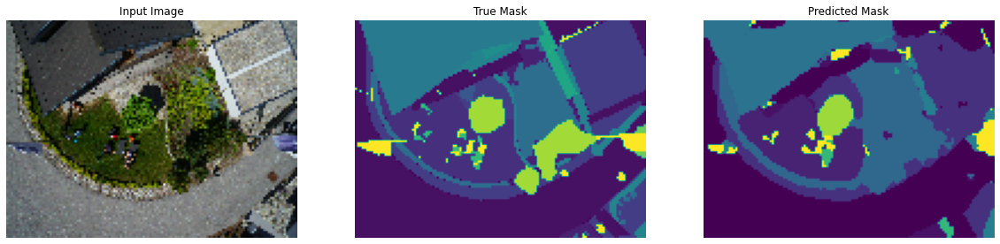

Epoch 171/500
25/25 [==============================] - 1s 43ms/step - loss: 0.2494 - accuracy: 0.9154 - val_loss: 0.4795 - val_accuracy: 0.8633
Epoch 172/500
25/25 [==============================] - 1s 46ms/step - loss: 0.2454 - accuracy: 0.9168 - val_loss: 0.4911 - val_accuracy: 0.8601
Epoch 173/500
25/25 [==============================] - 1s 44ms/step - loss: 0.2399 - accuracy: 0.9184 - val_loss: 0.4866 - val_accuracy: 0.8635
Epoch 174/500
25/25 [==============================] - 1s 43ms/step - loss: 0.2406 - accuracy: 0.9182 - val_loss: 0.4753 - val_accuracy: 0.8653
Epoch 175/500
25/25 [==============================] - 1s 43ms/step - loss: 0.2399 - accuracy: 0.9183 - val_loss: 0.5249 - val_accuracy: 0.8581
Epoch 176/500
25/25 [==============================] - 1s 43ms/step - loss: 0.2394 - accuracy: 0.9184 - val_loss: 0.5137 - val_accuracy: 0.8557
Epoch 177/500
25/25 [==============================] - 1s 44ms/step - loss: 0.2374 - accuracy: 0.9194 - val_loss: 0.4930 - val_accuracy:

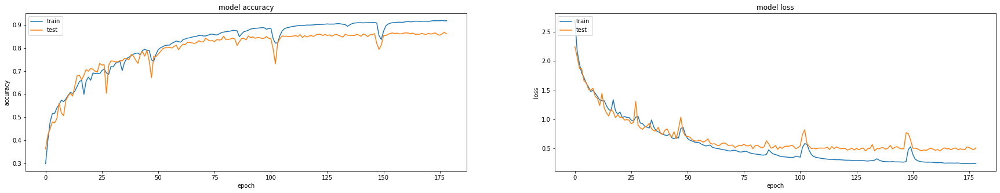

------- partial predictions -------


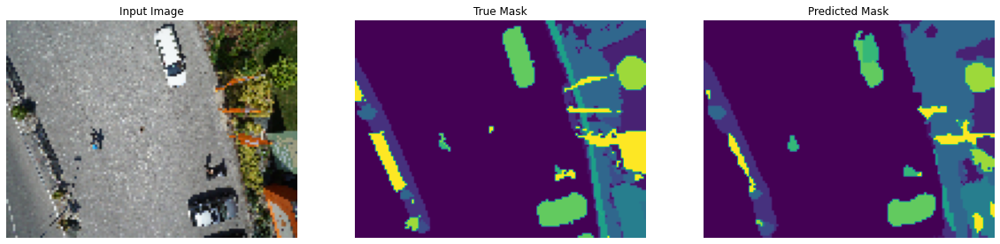

Epoch 181/500
25/25 [==============================] - 1s 44ms/step - loss: 0.2372 - accuracy: 0.9190 - val_loss: 0.4844 - val_accuracy: 0.8646
Epoch 182/500
25/25 [==============================] - 1s 45ms/step - loss: 0.2442 - accuracy: 0.9171 - val_loss: 0.5089 - val_accuracy: 0.8584
Epoch 183/500
25/25 [==============================] - 1s 43ms/step - loss: 0.2398 - accuracy: 0.9184 - val_loss: 0.4791 - val_accuracy: 0.8648
Epoch 184/500
25/25 [==============================] - 1s 43ms/step - loss: 0.2352 - accuracy: 0.9197 - val_loss: 0.4924 - val_accuracy: 0.8671
Epoch 185/500
25/25 [==============================] - 1s 43ms/step - loss: 0.2340 - accuracy: 0.9200 - val_loss: 0.4923 - val_accuracy: 0.8686
Epoch 186/500
25/25 [==============================] - 1s 43ms/step - loss: 0.2521 - accuracy: 0.9159 - val_loss: 0.5476 - val_accuracy: 0.8500
Epoch 187/500
25/25 [==============================] - 1s 43ms/step - loss: 0.2423 - accuracy: 0.9182 - val_loss: 0.5069 - val_accuracy:

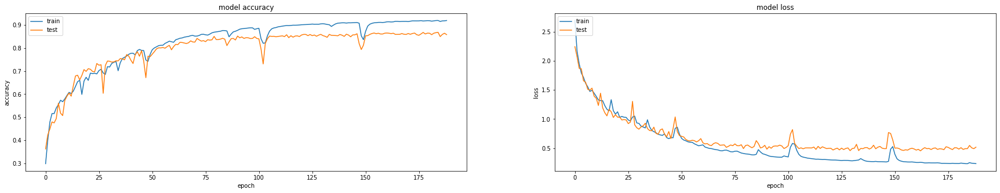

------- partial predictions -------


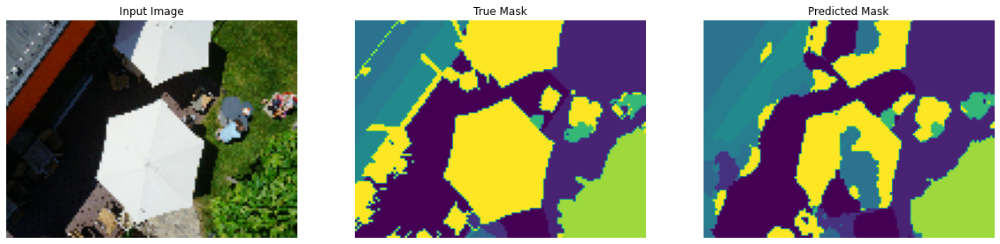

Epoch 191/500
25/25 [==============================] - 1s 43ms/step - loss: 0.2353 - accuracy: 0.9200 - val_loss: 0.5917 - val_accuracy: 0.8367
Epoch 192/500
25/25 [==============================] - 1s 43ms/step - loss: 0.4884 - accuracy: 0.8494 - val_loss: 0.7886 - val_accuracy: 0.7668
Epoch 193/500
25/25 [==============================] - 1s 43ms/step - loss: 0.7199 - accuracy: 0.7846 - val_loss: 0.6580 - val_accuracy: 0.8017
Epoch 194/500
25/25 [==============================] - 1s 43ms/step - loss: 0.5163 - accuracy: 0.8388 - val_loss: 0.5846 - val_accuracy: 0.8187
Epoch 195/500
25/25 [==============================] - 1s 43ms/step - loss: 0.3939 - accuracy: 0.8731 - val_loss: 0.4850 - val_accuracy: 0.8522
Epoch 196/500
25/25 [==============================] - 1s 43ms/step - loss: 0.3212 - accuracy: 0.8944 - val_loss: 0.4858 - val_accuracy: 0.8551
Epoch 197/500
25/25 [==============================] - 1s 45ms/step - loss: 0.2833 - accuracy: 0.9051 - val_loss: 0.4810 - val_accuracy:

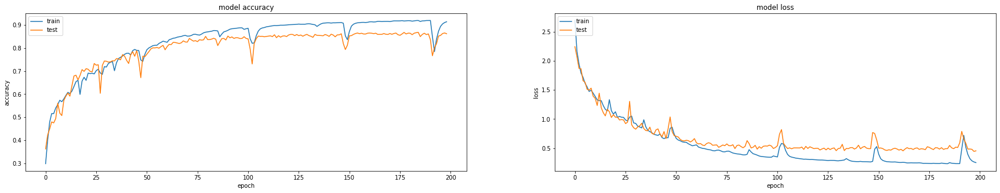

------- partial predictions -------


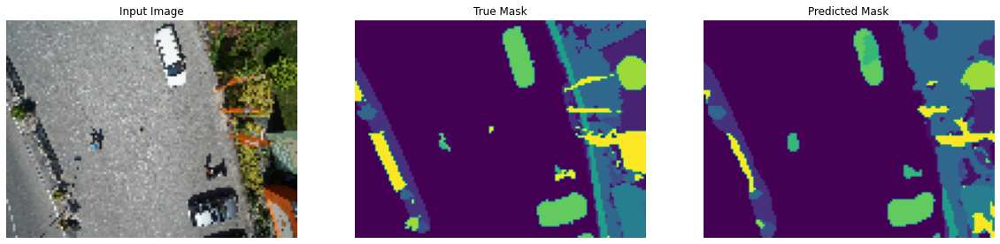

Epoch 201/500
25/25 [==============================] - 1s 43ms/step - loss: 0.2425 - accuracy: 0.9181 - val_loss: 0.4402 - val_accuracy: 0.8689
Epoch 202/500
25/25 [==============================] - 1s 43ms/step - loss: 0.2379 - accuracy: 0.9188 - val_loss: 0.4647 - val_accuracy: 0.8650
Epoch 203/500
25/25 [==============================] - 1s 43ms/step - loss: 0.2341 - accuracy: 0.9202 - val_loss: 0.4524 - val_accuracy: 0.8686
Epoch 204/500
25/25 [==============================] - 1s 42ms/step - loss: 0.2363 - accuracy: 0.9195 - val_loss: 0.4428 - val_accuracy: 0.8708
Epoch 205/500
25/25 [==============================] - 1s 43ms/step - loss: 0.2334 - accuracy: 0.9205 - val_loss: 0.4414 - val_accuracy: 0.8681
Epoch 206/500
25/25 [==============================] - 1s 43ms/step - loss: 0.2333 - accuracy: 0.9201 - val_loss: 0.4665 - val_accuracy: 0.8645
Epoch 207/500
25/25 [==============================] - 1s 43ms/step - loss: 0.2311 - accuracy: 0.9208 - val_loss: 0.4539 - val_accuracy:

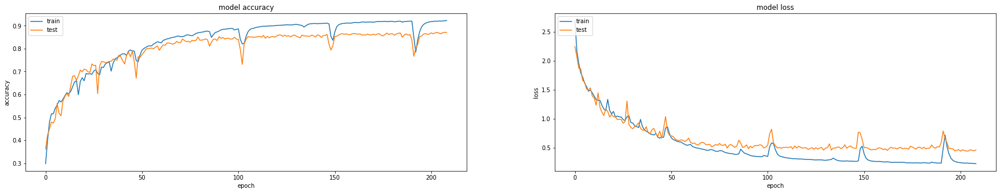

------- partial predictions -------


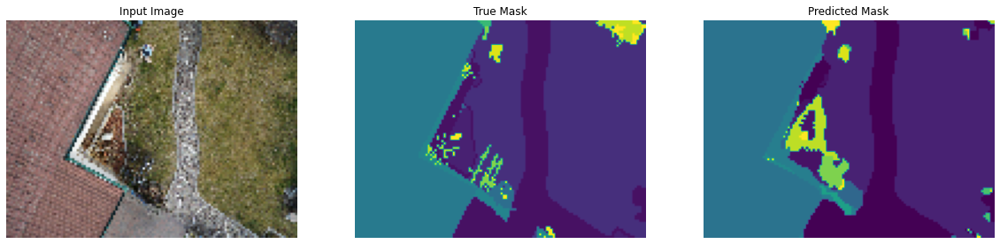

Epoch 211/500
25/25 [==============================] - 1s 43ms/step - loss: 0.2222 - accuracy: 0.9236 - val_loss: 0.4835 - val_accuracy: 0.8636
Epoch 212/500
25/25 [==============================] - 1s 42ms/step - loss: 0.2223 - accuracy: 0.9236 - val_loss: 0.4849 - val_accuracy: 0.8645
Epoch 213/500
25/25 [==============================] - 1s 43ms/step - loss: 0.2245 - accuracy: 0.9230 - val_loss: 0.4688 - val_accuracy: 0.8703
Epoch 214/500
25/25 [==============================] - 1s 43ms/step - loss: 0.2212 - accuracy: 0.9238 - val_loss: 0.4641 - val_accuracy: 0.8677
Epoch 215/500
25/25 [==============================] - 1s 43ms/step - loss: 0.2214 - accuracy: 0.9237 - val_loss: 0.4794 - val_accuracy: 0.8662
Epoch 216/500
25/25 [==============================] - 1s 44ms/step - loss: 0.2198 - accuracy: 0.9244 - val_loss: 0.4692 - val_accuracy: 0.8678
Epoch 217/500
25/25 [==============================] - 1s 43ms/step - loss: 0.2210 - accuracy: 0.9238 - val_loss: 0.4745 - val_accuracy:

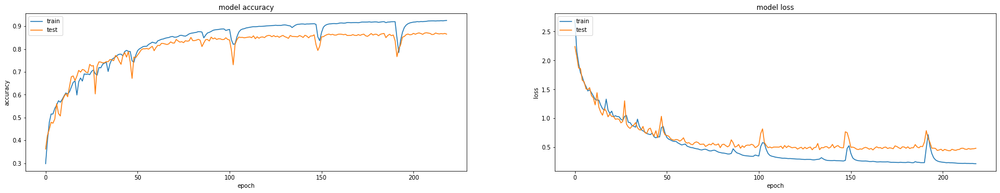

------- partial predictions -------


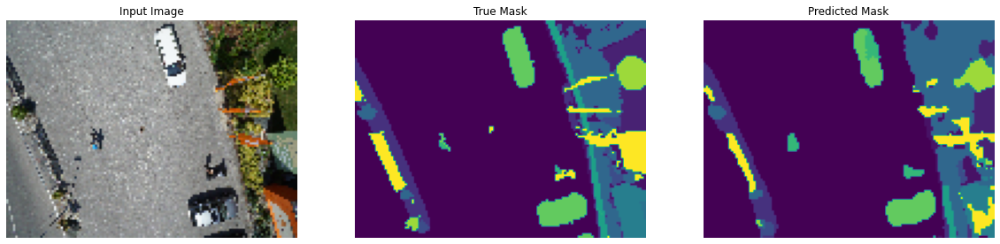

Epoch 221/500
25/25 [==============================] - 1s 44ms/step - loss: 0.2189 - accuracy: 0.9244 - val_loss: 0.5033 - val_accuracy: 0.8628
Epoch 222/500
25/25 [==============================] - 1s 43ms/step - loss: 0.2206 - accuracy: 0.9240 - val_loss: 0.4628 - val_accuracy: 0.8696
Epoch 223/500
25/25 [==============================] - 1s 43ms/step - loss: 0.2166 - accuracy: 0.9250 - val_loss: 0.4584 - val_accuracy: 0.8715
Epoch 224/500
25/25 [==============================] - 1s 43ms/step - loss: 0.2144 - accuracy: 0.9259 - val_loss: 0.4622 - val_accuracy: 0.8726
Epoch 225/500
25/25 [==============================] - 1s 43ms/step - loss: 0.2139 - accuracy: 0.9261 - val_loss: 0.4724 - val_accuracy: 0.8662
Epoch 226/500
25/25 [==============================] - 1s 43ms/step - loss: 0.2178 - accuracy: 0.9247 - val_loss: 0.4992 - val_accuracy: 0.8638
Epoch 227/500
25/25 [==============================] - 1s 43ms/step - loss: 0.2155 - accuracy: 0.9255 - val_loss: 0.5114 - val_accuracy:

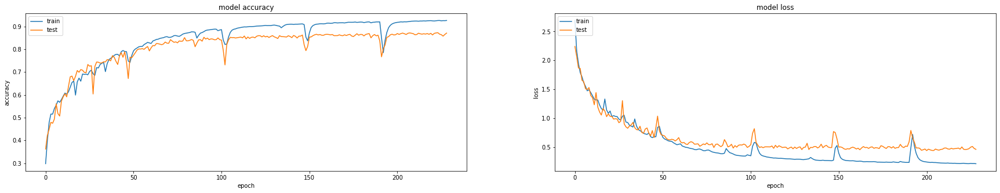

------- partial predictions -------


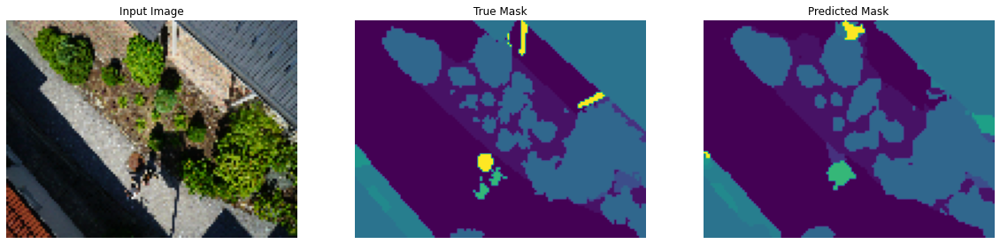

Epoch 231/500
25/25 [==============================] - 1s 43ms/step - loss: 0.2147 - accuracy: 0.9257 - val_loss: 0.5012 - val_accuracy: 0.8617
Epoch 232/500
25/25 [==============================] - 1s 43ms/step - loss: 0.2226 - accuracy: 0.9231 - val_loss: 0.4772 - val_accuracy: 0.8674
Epoch 233/500
25/25 [==============================] - 1s 43ms/step - loss: 0.2208 - accuracy: 0.9237 - val_loss: 0.4479 - val_accuracy: 0.8742
Epoch 234/500
25/25 [==============================] - 1s 43ms/step - loss: 0.2150 - accuracy: 0.9256 - val_loss: 0.4714 - val_accuracy: 0.8651
Epoch 235/500
25/25 [==============================] - 1s 43ms/step - loss: 0.2145 - accuracy: 0.9258 - val_loss: 0.4807 - val_accuracy: 0.8667
Epoch 236/500
25/25 [==============================] - 1s 43ms/step - loss: 0.2133 - accuracy: 0.9260 - val_loss: 0.4709 - val_accuracy: 0.8686
Epoch 237/500
25/25 [==============================] - 1s 43ms/step - loss: 0.2104 - accuracy: 0.9271 - val_loss: 0.4680 - val_accuracy:

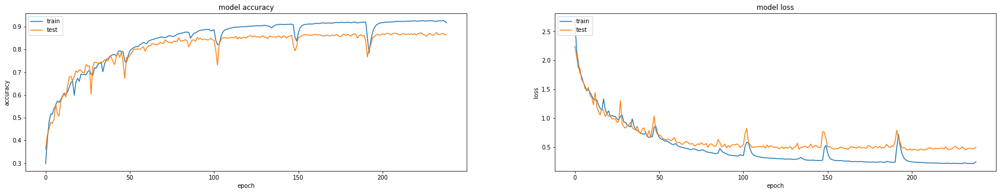

------- partial predictions -------


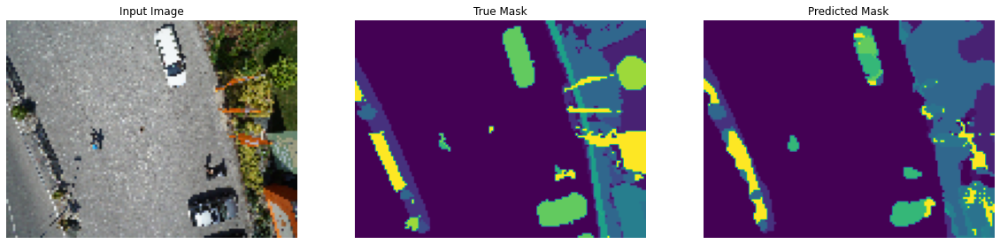

Epoch 241/500
25/25 [==============================] - 1s 43ms/step - loss: 0.7182 - accuracy: 0.7848 - val_loss: 0.6299 - val_accuracy: 0.8090
Epoch 242/500
25/25 [==============================] - 1s 45ms/step - loss: 0.4907 - accuracy: 0.8469 - val_loss: 0.6485 - val_accuracy: 0.8128
Epoch 243/500
25/25 [==============================] - 1s 43ms/step - loss: 0.4032 - accuracy: 0.8711 - val_loss: 0.5031 - val_accuracy: 0.8433
Epoch 244/500
25/25 [==============================] - 1s 43ms/step - loss: 0.3238 - accuracy: 0.8942 - val_loss: 0.5072 - val_accuracy: 0.8493
Epoch 245/500
25/25 [==============================] - 1s 43ms/step - loss: 0.3180 - accuracy: 0.8957 - val_loss: 0.4737 - val_accuracy: 0.8616
Epoch 246/500
25/25 [==============================] - 1s 43ms/step - loss: 0.2758 - accuracy: 0.9080 - val_loss: 0.4574 - val_accuracy: 0.8679
Epoch 247/500
25/25 [==============================] - 1s 43ms/step - loss: 0.2605 - accuracy: 0.9126 - val_loss: 0.4532 - val_accuracy:

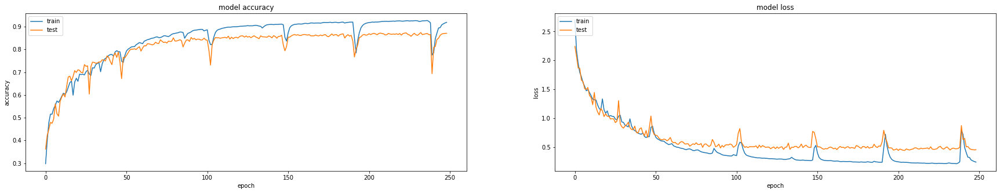

------- partial predictions -------


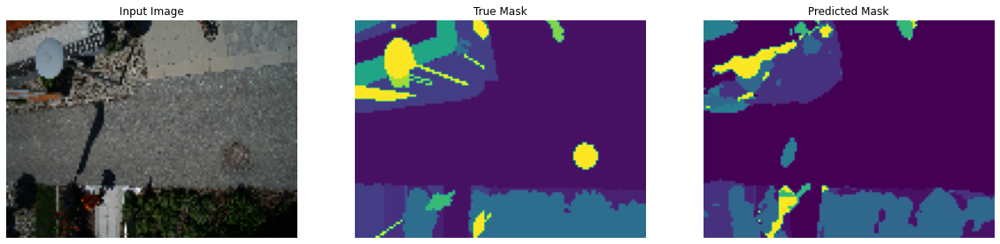

Epoch 251/500
25/25 [==============================] - 1s 44ms/step - loss: 0.2278 - accuracy: 0.9221 - val_loss: 0.4612 - val_accuracy: 0.8694
Epoch 252/500
25/25 [==============================] - 1s 44ms/step - loss: 0.2260 - accuracy: 0.9227 - val_loss: 0.4644 - val_accuracy: 0.8700
Epoch 253/500
25/25 [==============================] - 1s 43ms/step - loss: 0.2258 - accuracy: 0.9225 - val_loss: 0.4506 - val_accuracy: 0.8713
Epoch 254/500
25/25 [==============================] - 1s 43ms/step - loss: 0.2193 - accuracy: 0.9244 - val_loss: 0.4563 - val_accuracy: 0.8724
Epoch 255/500
25/25 [==============================] - 1s 43ms/step - loss: 0.2178 - accuracy: 0.9251 - val_loss: 0.4948 - val_accuracy: 0.8628
Epoch 256/500
25/25 [==============================] - 1s 43ms/step - loss: 0.2145 - accuracy: 0.9258 - val_loss: 0.4487 - val_accuracy: 0.8728
Epoch 257/500
25/25 [==============================] - 1s 43ms/step - loss: 0.2136 - accuracy: 0.9262 - val_loss: 0.4489 - val_accuracy:

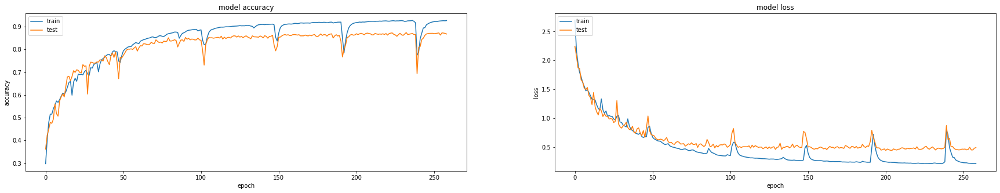

------- partial predictions -------


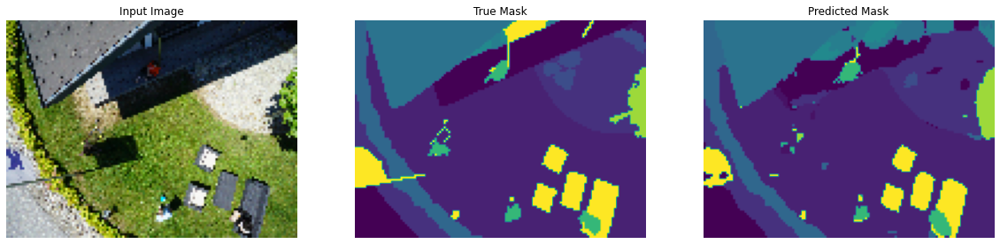

Epoch 261/500
25/25 [==============================] - 1s 43ms/step - loss: 0.2088 - accuracy: 0.9276 - val_loss: 0.4973 - val_accuracy: 0.8660
Epoch 262/500
25/25 [==============================] - 1s 43ms/step - loss: 0.2083 - accuracy: 0.9277 - val_loss: 0.4836 - val_accuracy: 0.8675
Epoch 263/500
25/25 [==============================] - 1s 43ms/step - loss: 0.2081 - accuracy: 0.9277 - val_loss: 0.4739 - val_accuracy: 0.8713
Epoch 264/500
25/25 [==============================] - 1s 43ms/step - loss: 0.2076 - accuracy: 0.9278 - val_loss: 0.4687 - val_accuracy: 0.8727
Epoch 265/500
25/25 [==============================] - 1s 43ms/step - loss: 0.2079 - accuracy: 0.9278 - val_loss: 0.4865 - val_accuracy: 0.8652
Epoch 266/500
25/25 [==============================] - 1s 43ms/step - loss: 0.2059 - accuracy: 0.9283 - val_loss: 0.4679 - val_accuracy: 0.8698
Epoch 267/500
25/25 [==============================] - 1s 47ms/step - loss: 0.2043 - accuracy: 0.9289 - val_loss: 0.4851 - val_accuracy:

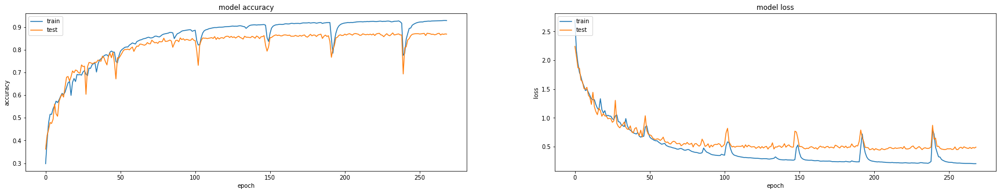

------- partial predictions -------


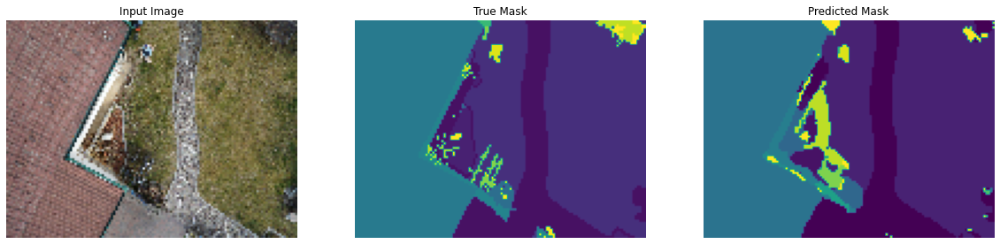

Epoch 271/500
25/25 [==============================] - 1s 43ms/step - loss: 0.2054 - accuracy: 0.9285 - val_loss: 0.4523 - val_accuracy: 0.8737
Epoch 272/500
25/25 [==============================] - 1s 43ms/step - loss: 0.2031 - accuracy: 0.9292 - val_loss: 0.4702 - val_accuracy: 0.8731
Epoch 273/500
25/25 [==============================] - 1s 43ms/step - loss: 0.2050 - accuracy: 0.9285 - val_loss: 0.4794 - val_accuracy: 0.8699
Epoch 274/500
25/25 [==============================] - 1s 44ms/step - loss: 0.2008 - accuracy: 0.9300 - val_loss: 0.4514 - val_accuracy: 0.8742
Epoch 275/500
25/25 [==============================] - 1s 43ms/step - loss: 0.1997 - accuracy: 0.9302 - val_loss: 0.4928 - val_accuracy: 0.8663
Epoch 276/500
25/25 [==============================] - 1s 43ms/step - loss: 0.1991 - accuracy: 0.9302 - val_loss: 0.4822 - val_accuracy: 0.8704
Epoch 277/500
25/25 [==============================] - 1s 44ms/step - loss: 0.1997 - accuracy: 0.9302 - val_loss: 0.5285 - val_accuracy:

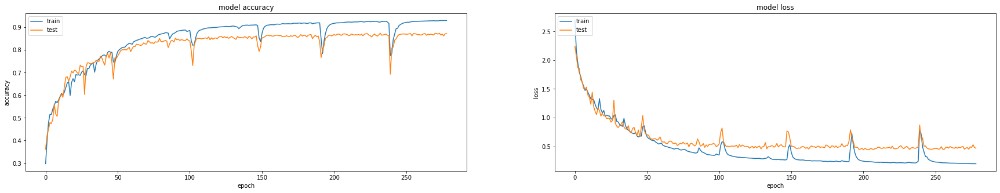

------- partial predictions -------


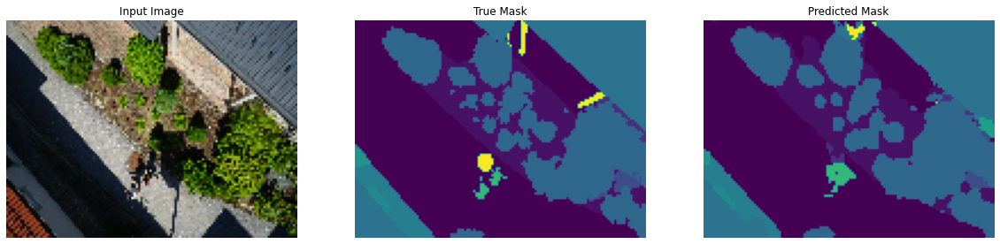

Epoch 281/500
25/25 [==============================] - 1s 43ms/step - loss: 0.1963 - accuracy: 0.9312 - val_loss: 0.4934 - val_accuracy: 0.8701
Epoch 282/500
25/25 [==============================] - 1s 43ms/step - loss: 0.1990 - accuracy: 0.9303 - val_loss: 0.4830 - val_accuracy: 0.8720
Epoch 283/500
25/25 [==============================] - 1s 43ms/step - loss: 0.2045 - accuracy: 0.9289 - val_loss: 0.4534 - val_accuracy: 0.8746
Epoch 284/500
25/25 [==============================] - 1s 43ms/step - loss: 0.2031 - accuracy: 0.9291 - val_loss: 0.4818 - val_accuracy: 0.8679
Epoch 285/500
25/25 [==============================] - 1s 43ms/step - loss: 0.1985 - accuracy: 0.9305 - val_loss: 0.4783 - val_accuracy: 0.8729
Epoch 286/500
25/25 [==============================] - 1s 43ms/step - loss: 0.1958 - accuracy: 0.9311 - val_loss: 0.4657 - val_accuracy: 0.8701
Epoch 287/500
25/25 [==============================] - 1s 43ms/step - loss: 0.2023 - accuracy: 0.9294 - val_loss: 0.4856 - val_accuracy:

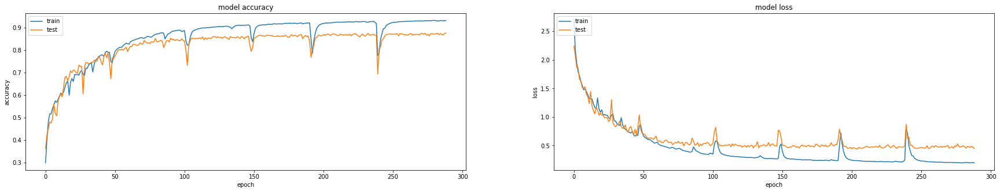

------- partial predictions -------


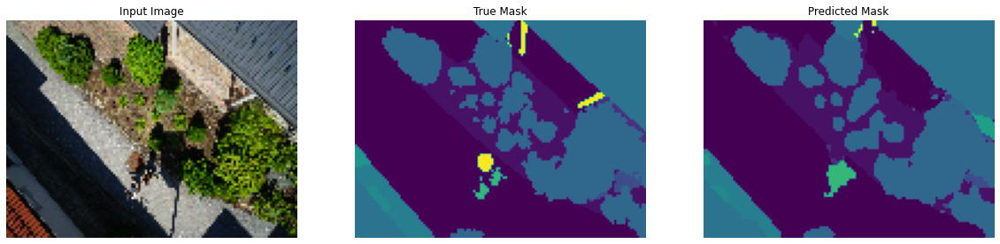

Epoch 291/500
25/25 [==============================] - 1s 47ms/step - loss: 0.1968 - accuracy: 0.9311 - val_loss: 0.4943 - val_accuracy: 0.8674
Epoch 292/500
25/25 [==============================] - 1s 43ms/step - loss: 0.1989 - accuracy: 0.9303 - val_loss: 0.4732 - val_accuracy: 0.8717
Epoch 293/500
25/25 [==============================] - 1s 43ms/step - loss: 0.1950 - accuracy: 0.9314 - val_loss: 0.4577 - val_accuracy: 0.8746
Epoch 294/500
25/25 [==============================] - 1s 43ms/step - loss: 0.1979 - accuracy: 0.9305 - val_loss: 0.4760 - val_accuracy: 0.8726
Epoch 295/500
25/25 [==============================] - 1s 43ms/step - loss: 0.1996 - accuracy: 0.9302 - val_loss: 0.4657 - val_accuracy: 0.8731
Epoch 296/500
25/25 [==============================] - 1s 43ms/step - loss: 0.1972 - accuracy: 0.9308 - val_loss: 0.5009 - val_accuracy: 0.8667
Epoch 297/500
25/25 [==============================] - 1s 43ms/step - loss: 0.1981 - accuracy: 0.9309 - val_loss: 0.4777 - val_accuracy:

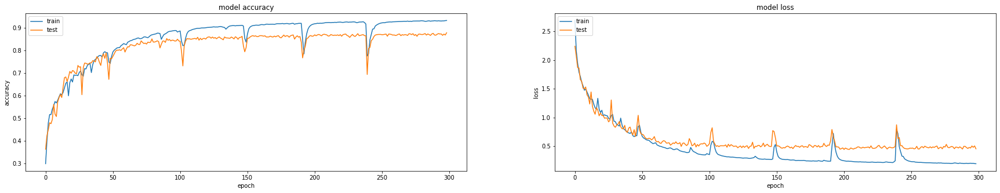

------- partial predictions -------


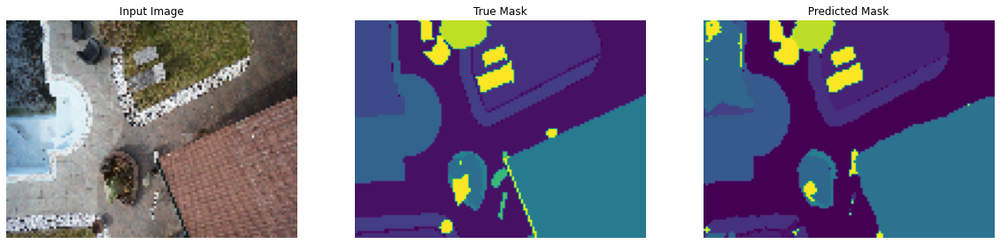

Epoch 301/500
25/25 [==============================] - 1s 44ms/step - loss: 0.1935 - accuracy: 0.9317 - val_loss: 0.5098 - val_accuracy: 0.8693
Epoch 302/500
25/25 [==============================] - 1s 44ms/step - loss: 0.2014 - accuracy: 0.9296 - val_loss: 0.4570 - val_accuracy: 0.8751
Epoch 303/500
25/25 [==============================] - 1s 43ms/step - loss: 0.2050 - accuracy: 0.9284 - val_loss: 0.5257 - val_accuracy: 0.8638
Epoch 304/500
25/25 [==============================] - 1s 43ms/step - loss: 0.3615 - accuracy: 0.8874 - val_loss: 0.6656 - val_accuracy: 0.8213
Epoch 305/500
25/25 [==============================] - 1s 43ms/step - loss: 0.5236 - accuracy: 0.8400 - val_loss: 0.5984 - val_accuracy: 0.8308
Epoch 306/500
25/25 [==============================] - 1s 43ms/step - loss: 0.3546 - accuracy: 0.8857 - val_loss: 0.5214 - val_accuracy: 0.8470
Epoch 307/500
25/25 [==============================] - 1s 43ms/step - loss: 0.2776 - accuracy: 0.9073 - val_loss: 0.4892 - val_accuracy:

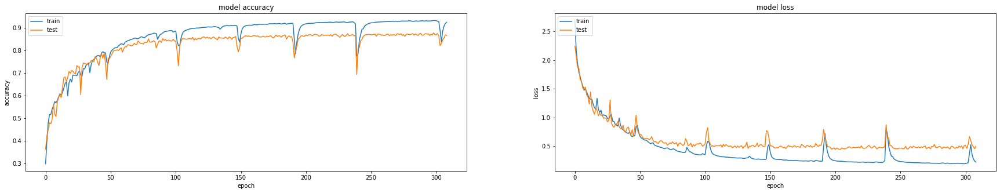

------- partial predictions -------


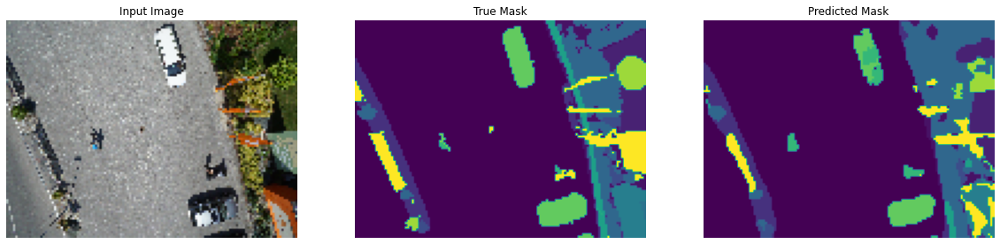

Epoch 311/500
25/25 [==============================] - 1s 43ms/step - loss: 0.2021 - accuracy: 0.9295 - val_loss: 0.4702 - val_accuracy: 0.8709
Epoch 312/500
25/25 [==============================] - 1s 43ms/step - loss: 0.1980 - accuracy: 0.9308 - val_loss: 0.4893 - val_accuracy: 0.8672
Epoch 313/500
25/25 [==============================] - 1s 43ms/step - loss: 0.1962 - accuracy: 0.9315 - val_loss: 0.4654 - val_accuracy: 0.8724
Epoch 314/500
25/25 [==============================] - 1s 42ms/step - loss: 0.1954 - accuracy: 0.9315 - val_loss: 0.4903 - val_accuracy: 0.8690
Epoch 315/500
25/25 [==============================] - 1s 44ms/step - loss: 0.1933 - accuracy: 0.9322 - val_loss: 0.4817 - val_accuracy: 0.8729
Epoch 316/500
25/25 [==============================] - 1s 44ms/step - loss: 0.1921 - accuracy: 0.9324 - val_loss: 0.4764 - val_accuracy: 0.8742
Epoch 317/500
25/25 [==============================] - 1s 42ms/step - loss: 0.1890 - accuracy: 0.9336 - val_loss: 0.4908 - val_accuracy:

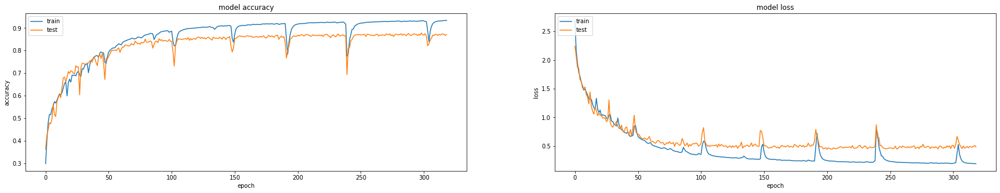

------- partial predictions -------


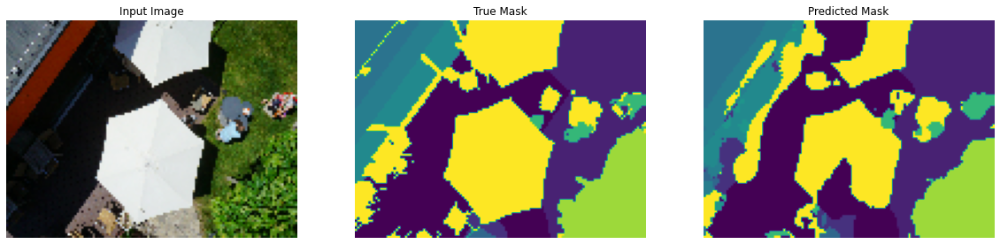

Epoch 321/500
25/25 [==============================] - 1s 43ms/step - loss: 0.1868 - accuracy: 0.9340 - val_loss: 0.4740 - val_accuracy: 0.8747
Epoch 322/500
25/25 [==============================] - 1s 43ms/step - loss: 0.1861 - accuracy: 0.9343 - val_loss: 0.4775 - val_accuracy: 0.8738
Epoch 323/500
25/25 [==============================] - 1s 43ms/step - loss: 0.1852 - accuracy: 0.9346 - val_loss: 0.4852 - val_accuracy: 0.8744
Epoch 324/500
25/25 [==============================] - 1s 43ms/step - loss: 0.1855 - accuracy: 0.9343 - val_loss: 0.4613 - val_accuracy: 0.8753
Epoch 325/500
25/25 [==============================] - 1s 43ms/step - loss: 0.1845 - accuracy: 0.9347 - val_loss: 0.4738 - val_accuracy: 0.8731
Epoch 326/500
25/25 [==============================] - 1s 44ms/step - loss: 0.1841 - accuracy: 0.9349 - val_loss: 0.4666 - val_accuracy: 0.8748
Epoch 327/500
25/25 [==============================] - 1s 44ms/step - loss: 0.1853 - accuracy: 0.9344 - val_loss: 0.5027 - val_accuracy:

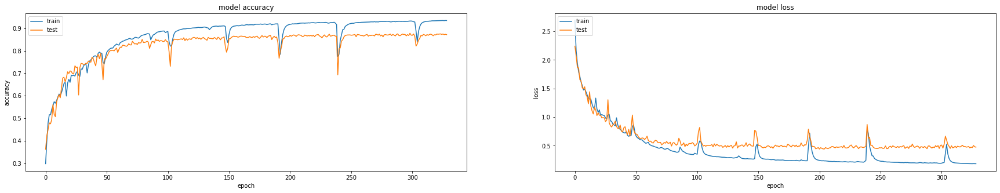

------- partial predictions -------


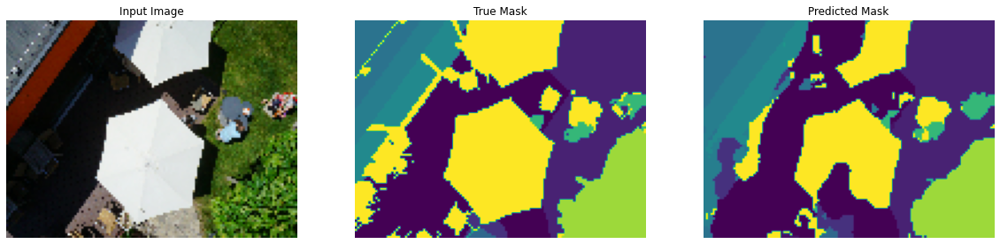

Epoch 331/500
25/25 [==============================] - 1s 43ms/step - loss: 0.1832 - accuracy: 0.9350 - val_loss: 0.4809 - val_accuracy: 0.8739
Epoch 332/500
25/25 [==============================] - 1s 43ms/step - loss: 0.1825 - accuracy: 0.9353 - val_loss: 0.4819 - val_accuracy: 0.8741
Epoch 333/500
25/25 [==============================] - 1s 43ms/step - loss: 0.1829 - accuracy: 0.9351 - val_loss: 0.4822 - val_accuracy: 0.8725
Epoch 334/500
25/25 [==============================] - 1s 43ms/step - loss: 0.1811 - accuracy: 0.9357 - val_loss: 0.4779 - val_accuracy: 0.8737
Epoch 335/500
25/25 [==============================] - 1s 43ms/step - loss: 0.1829 - accuracy: 0.9352 - val_loss: 0.4812 - val_accuracy: 0.8746
Epoch 336/500
25/25 [==============================] - 1s 43ms/step - loss: 0.1848 - accuracy: 0.9347 - val_loss: 0.5177 - val_accuracy: 0.8666
Epoch 337/500
25/25 [==============================] - 1s 43ms/step - loss: 0.1843 - accuracy: 0.9347 - val_loss: 0.4650 - val_accuracy:

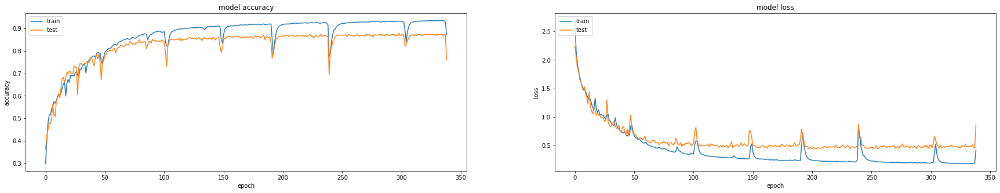

------- partial predictions -------


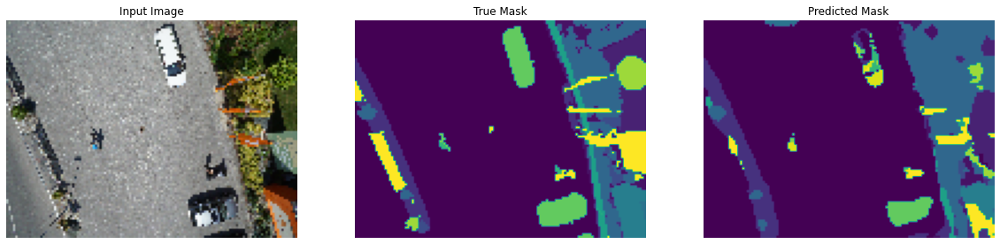

Epoch 341/500
25/25 [==============================] - 1s 43ms/step - loss: 0.4320 - accuracy: 0.8643 - val_loss: 0.4688 - val_accuracy: 0.8557
Epoch 342/500
25/25 [==============================] - 1s 43ms/step - loss: 0.3062 - accuracy: 0.8982 - val_loss: 0.4457 - val_accuracy: 0.8661
Epoch 343/500
25/25 [==============================] - 1s 43ms/step - loss: 0.2416 - accuracy: 0.9174 - val_loss: 0.4321 - val_accuracy: 0.8710
Epoch 344/500
25/25 [==============================] - 1s 43ms/step - loss: 0.2272 - accuracy: 0.9223 - val_loss: 0.4450 - val_accuracy: 0.8709
Epoch 345/500
25/25 [==============================] - 1s 43ms/step - loss: 0.2139 - accuracy: 0.9260 - val_loss: 0.4467 - val_accuracy: 0.8749
Epoch 346/500
25/25 [==============================] - 1s 43ms/step - loss: 0.2090 - accuracy: 0.9273 - val_loss: 0.4389 - val_accuracy: 0.8810
Epoch 347/500
25/25 [==============================] - 1s 43ms/step - loss: 0.2017 - accuracy: 0.9297 - val_loss: 0.4434 - val_accuracy:

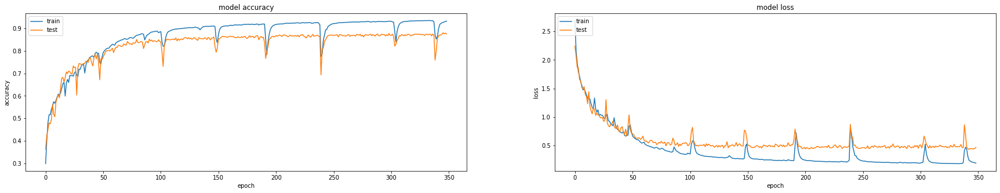

------- partial predictions -------


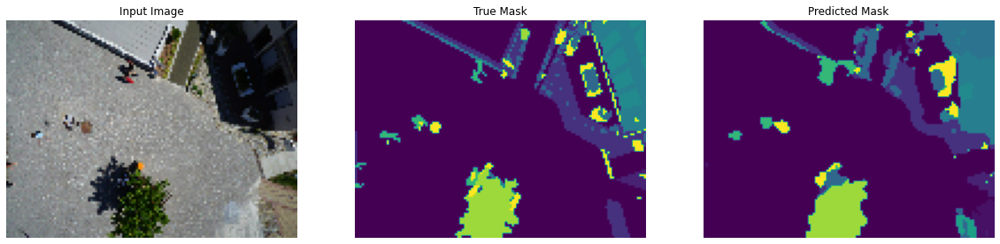

Epoch 351/500
25/25 [==============================] - 1s 43ms/step - loss: 0.1860 - accuracy: 0.9343 - val_loss: 0.4622 - val_accuracy: 0.8799
Epoch 352/500
25/25 [==============================] - 1s 44ms/step - loss: 0.1841 - accuracy: 0.9348 - val_loss: 0.4441 - val_accuracy: 0.8795
Epoch 353/500
25/25 [==============================] - 1s 45ms/step - loss: 0.1832 - accuracy: 0.9351 - val_loss: 0.4562 - val_accuracy: 0.8769
Epoch 354/500
25/25 [==============================] - 1s 43ms/step - loss: 0.1824 - accuracy: 0.9352 - val_loss: 0.4579 - val_accuracy: 0.8797
Epoch 355/500
25/25 [==============================] - 1s 43ms/step - loss: 0.1808 - accuracy: 0.9359 - val_loss: 0.4470 - val_accuracy: 0.8816
Epoch 356/500
25/25 [==============================] - 1s 43ms/step - loss: 0.1797 - accuracy: 0.9362 - val_loss: 0.4625 - val_accuracy: 0.8795
Epoch 357/500
25/25 [==============================] - 1s 43ms/step - loss: 0.1797 - accuracy: 0.9362 - val_loss: 0.4617 - val_accuracy:

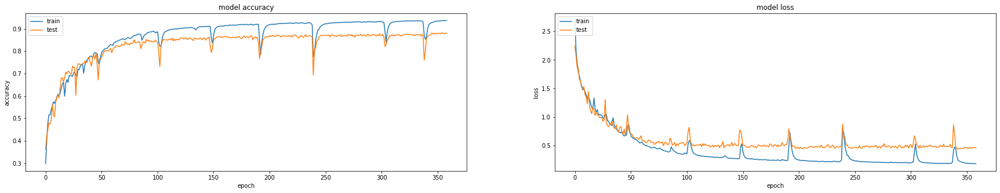

------- partial predictions -------


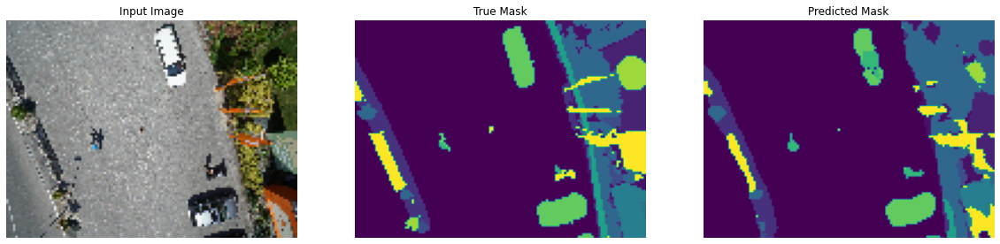

Epoch 361/500
25/25 [==============================] - 1s 43ms/step - loss: 0.1776 - accuracy: 0.9368 - val_loss: 0.4784 - val_accuracy: 0.8775
Epoch 362/500
25/25 [==============================] - 1s 43ms/step - loss: 0.1775 - accuracy: 0.9368 - val_loss: 0.4761 - val_accuracy: 0.8764
Epoch 363/500
25/25 [==============================] - 1s 43ms/step - loss: 0.1765 - accuracy: 0.9371 - val_loss: 0.4757 - val_accuracy: 0.8780
Epoch 364/500
25/25 [==============================] - 1s 45ms/step - loss: 0.1769 - accuracy: 0.9370 - val_loss: 0.4800 - val_accuracy: 0.8748
Epoch 365/500
25/25 [==============================] - 1s 44ms/step - loss: 0.1779 - accuracy: 0.9366 - val_loss: 0.4894 - val_accuracy: 0.8759
Epoch 366/500
25/25 [==============================] - 1s 43ms/step - loss: 0.1770 - accuracy: 0.9370 - val_loss: 0.4934 - val_accuracy: 0.8758
Epoch 367/500
25/25 [==============================] - 1s 44ms/step - loss: 0.1769 - accuracy: 0.9370 - val_loss: 0.4945 - val_accuracy:

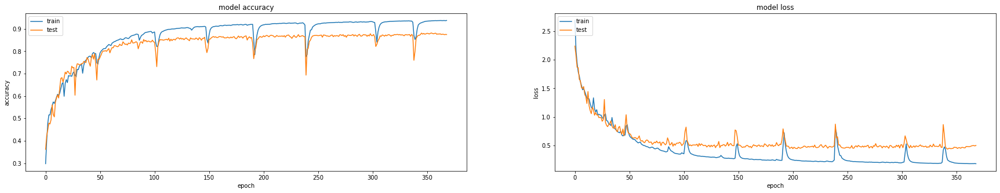

------- partial predictions -------


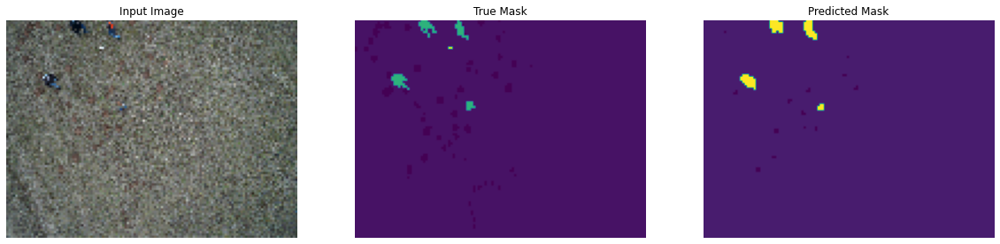

Epoch 371/500
25/25 [==============================] - 1s 43ms/step - loss: 0.1769 - accuracy: 0.9371 - val_loss: 0.4783 - val_accuracy: 0.8762
Epoch 372/500
25/25 [==============================] - 1s 43ms/step - loss: 0.1759 - accuracy: 0.9373 - val_loss: 0.4815 - val_accuracy: 0.8763
Epoch 373/500
25/25 [==============================] - 1s 43ms/step - loss: 0.1763 - accuracy: 0.9372 - val_loss: 0.4726 - val_accuracy: 0.8780
Epoch 374/500
25/25 [==============================] - 1s 43ms/step - loss: 0.1749 - accuracy: 0.9375 - val_loss: 0.4918 - val_accuracy: 0.8753
Epoch 375/500
25/25 [==============================] - 1s 44ms/step - loss: 0.1750 - accuracy: 0.9375 - val_loss: 0.4699 - val_accuracy: 0.8781
Epoch 376/500
25/25 [==============================] - 1s 42ms/step - loss: 0.1741 - accuracy: 0.9378 - val_loss: 0.4754 - val_accuracy: 0.8778
Epoch 377/500
25/25 [==============================] - 1s 43ms/step - loss: 0.1742 - accuracy: 0.9377 - val_loss: 0.4784 - val_accuracy:

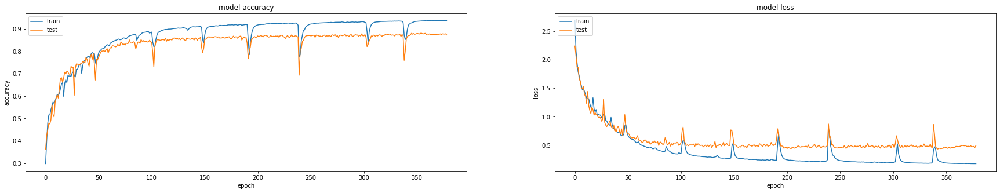

------- partial predictions -------


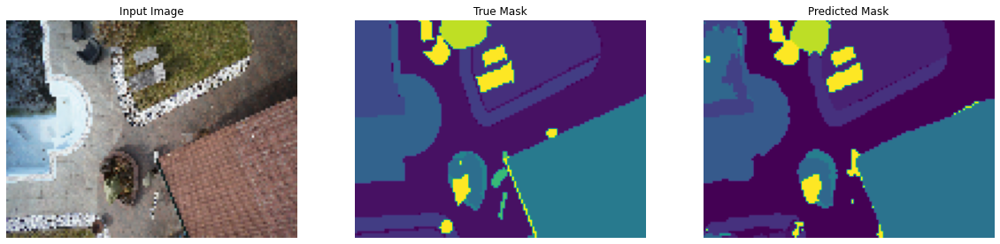

Epoch 381/500
25/25 [==============================] - 1s 43ms/step - loss: 0.1728 - accuracy: 0.9382 - val_loss: 0.5155 - val_accuracy: 0.8733
Epoch 382/500
25/25 [==============================] - 1s 43ms/step - loss: 0.1744 - accuracy: 0.9377 - val_loss: 0.4730 - val_accuracy: 0.8773
Epoch 383/500
25/25 [==============================] - 1s 42ms/step - loss: 0.1737 - accuracy: 0.9380 - val_loss: 0.4925 - val_accuracy: 0.8752
Epoch 384/500
25/25 [==============================] - 1s 43ms/step - loss: 0.1743 - accuracy: 0.9377 - val_loss: 0.4661 - val_accuracy: 0.8795
Epoch 385/500
25/25 [==============================] - 1s 42ms/step - loss: 0.1731 - accuracy: 0.9380 - val_loss: 0.4678 - val_accuracy: 0.8790
Epoch 386/500
25/25 [==============================] - 1s 43ms/step - loss: 0.1747 - accuracy: 0.9376 - val_loss: 0.5069 - val_accuracy: 0.8711
Epoch 387/500
25/25 [==============================] - 1s 43ms/step - loss: 0.1774 - accuracy: 0.9368 - val_loss: 0.5143 - val_accuracy:

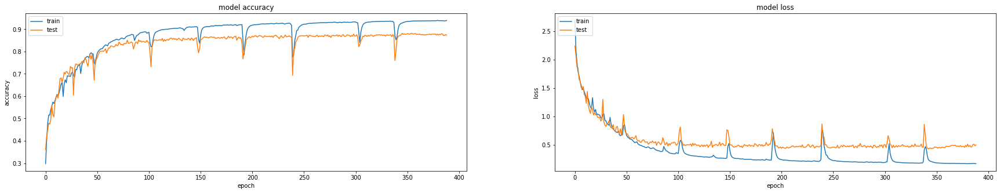

------- partial predictions -------


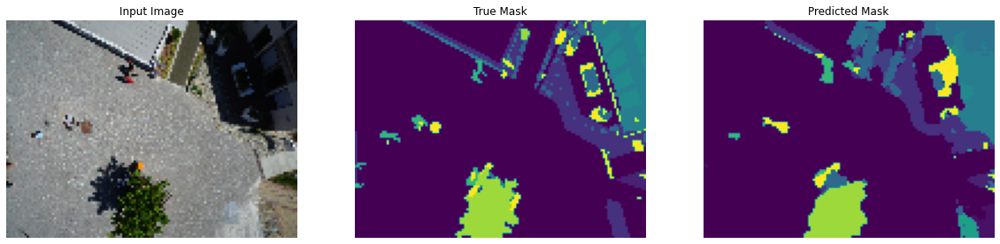

Epoch 391/500
25/25 [==============================] - 1s 43ms/step - loss: 0.1710 - accuracy: 0.9387 - val_loss: 0.4883 - val_accuracy: 0.8757
Epoch 392/500
25/25 [==============================] - 1s 43ms/step - loss: 0.1705 - accuracy: 0.9389 - val_loss: 0.5044 - val_accuracy: 0.8750
Epoch 393/500
25/25 [==============================] - 1s 43ms/step - loss: 0.1714 - accuracy: 0.9386 - val_loss: 0.4793 - val_accuracy: 0.8759
Epoch 394/500
25/25 [==============================] - 1s 43ms/step - loss: 0.1719 - accuracy: 0.9385 - val_loss: 0.4886 - val_accuracy: 0.8732
Epoch 395/500
25/25 [==============================] - 1s 43ms/step - loss: 0.1720 - accuracy: 0.9383 - val_loss: 0.4921 - val_accuracy: 0.8760
Epoch 396/500
25/25 [==============================] - 1s 43ms/step - loss: 0.1719 - accuracy: 0.9385 - val_loss: 0.4745 - val_accuracy: 0.8776
Epoch 397/500
25/25 [==============================] - 1s 43ms/step - loss: 0.1708 - accuracy: 0.9387 - val_loss: 0.4924 - val_accuracy:

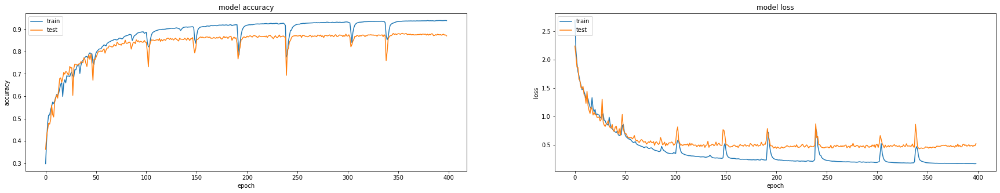

------- partial predictions -------


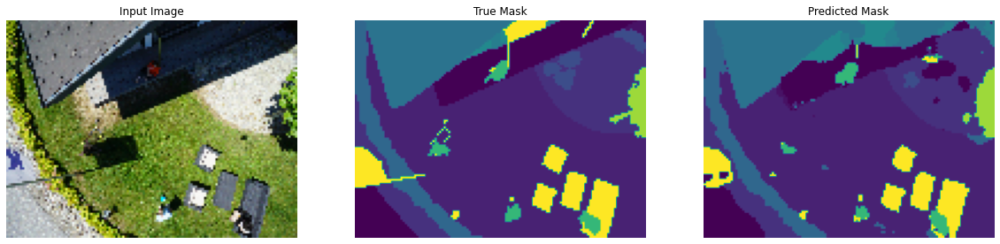

Epoch 401/500
25/25 [==============================] - 1s 43ms/step - loss: 0.1694 - accuracy: 0.9393 - val_loss: 0.5348 - val_accuracy: 0.8706
Epoch 402/500
25/25 [==============================] - 1s 43ms/step - loss: 0.1751 - accuracy: 0.9375 - val_loss: 0.5005 - val_accuracy: 0.8719
Epoch 403/500
25/25 [==============================] - 1s 44ms/step - loss: 0.1785 - accuracy: 0.9365 - val_loss: 0.5257 - val_accuracy: 0.8662
Epoch 404/500
25/25 [==============================] - 1s 44ms/step - loss: 0.1763 - accuracy: 0.9369 - val_loss: 0.5241 - val_accuracy: 0.8696
Epoch 405/500
25/25 [==============================] - 1s 44ms/step - loss: 0.1748 - accuracy: 0.9375 - val_loss: 0.5019 - val_accuracy: 0.8730
Epoch 406/500
25/25 [==============================] - 1s 43ms/step - loss: 0.1728 - accuracy: 0.9381 - val_loss: 0.4958 - val_accuracy: 0.8748
Epoch 407/500
25/25 [==============================] - 1s 43ms/step - loss: 0.1702 - accuracy: 0.9390 - val_loss: 0.5065 - val_accuracy:

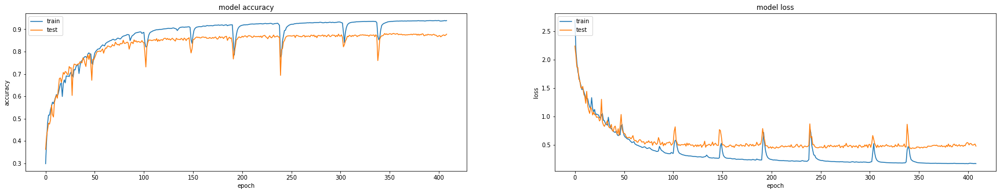

------- partial predictions -------


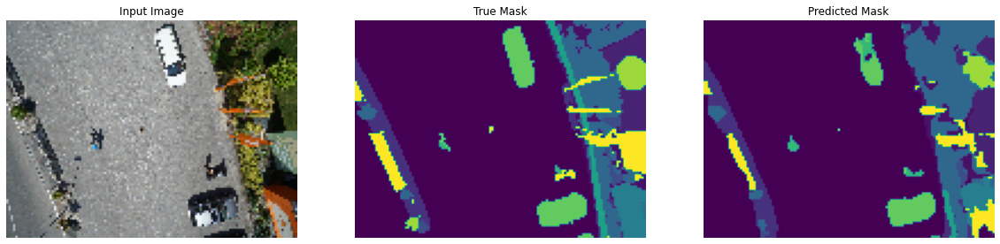

Epoch 411/500
25/25 [==============================] - 1s 43ms/step - loss: 0.1733 - accuracy: 0.9378 - val_loss: 0.4894 - val_accuracy: 0.8755
Epoch 412/500
25/25 [==============================] - 1s 43ms/step - loss: 0.1687 - accuracy: 0.9395 - val_loss: 0.4842 - val_accuracy: 0.8768
Epoch 413/500
25/25 [==============================] - 1s 45ms/step - loss: 0.1711 - accuracy: 0.9388 - val_loss: 0.5259 - val_accuracy: 0.8694
Epoch 414/500
25/25 [==============================] - 1s 45ms/step - loss: 0.1714 - accuracy: 0.9387 - val_loss: 0.5294 - val_accuracy: 0.8676
Epoch 415/500
25/25 [==============================] - 1s 43ms/step - loss: 0.1768 - accuracy: 0.9371 - val_loss: 0.4935 - val_accuracy: 0.8739
Epoch 416/500
25/25 [==============================] - 1s 43ms/step - loss: 0.1733 - accuracy: 0.9379 - val_loss: 0.4929 - val_accuracy: 0.8717
Epoch 417/500
25/25 [==============================] - 1s 43ms/step - loss: 0.1718 - accuracy: 0.9385 - val_loss: 0.5173 - val_accuracy:

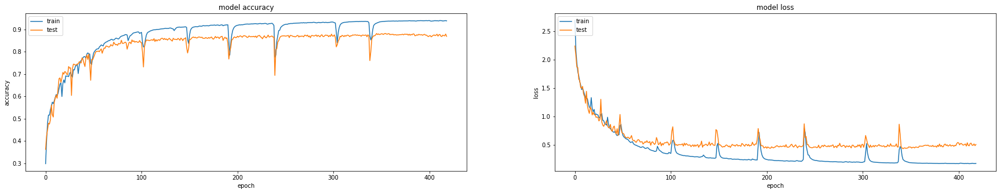

------- partial predictions -------


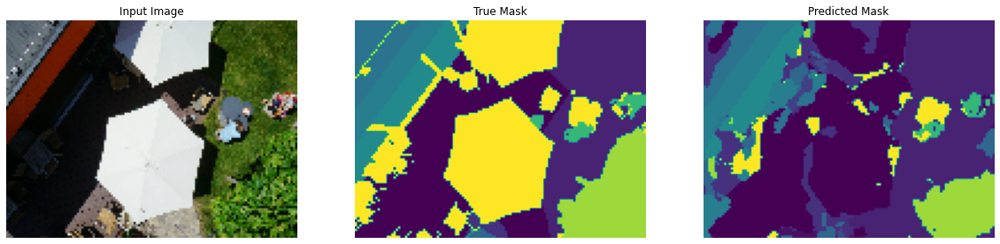

Epoch 421/500
25/25 [==============================] - 1s 44ms/step - loss: 0.8605 - accuracy: 0.7549 - val_loss: 0.8191 - val_accuracy: 0.7743
Epoch 422/500
25/25 [==============================] - 1s 43ms/step - loss: 0.6452 - accuracy: 0.8043 - val_loss: 0.7289 - val_accuracy: 0.7927
Epoch 423/500
25/25 [==============================] - 1s 43ms/step - loss: 0.4972 - accuracy: 0.8446 - val_loss: 0.4974 - val_accuracy: 0.8481
Epoch 424/500
25/25 [==============================] - 1s 43ms/step - loss: 0.3384 - accuracy: 0.8903 - val_loss: 0.5276 - val_accuracy: 0.8521
Epoch 425/500
25/25 [==============================] - 1s 43ms/step - loss: 0.2866 - accuracy: 0.9053 - val_loss: 0.4955 - val_accuracy: 0.8601
Epoch 426/500
25/25 [==============================] - 1s 43ms/step - loss: 0.2473 - accuracy: 0.9160 - val_loss: 0.4992 - val_accuracy: 0.8620
Epoch 427/500
25/25 [==============================] - 1s 43ms/step - loss: 0.2245 - accuracy: 0.9231 - val_loss: 0.4727 - val_accuracy:

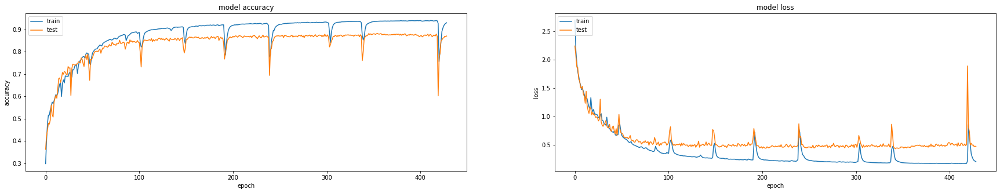

------- partial predictions -------


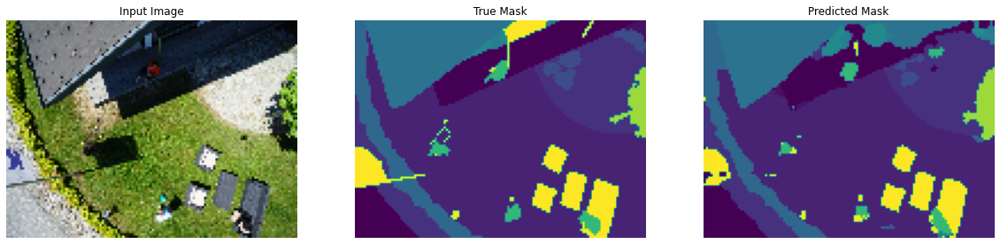

Epoch 431/500
25/25 [==============================] - 1s 43ms/step - loss: 0.2023 - accuracy: 0.9296 - val_loss: 0.5078 - val_accuracy: 0.8630
Epoch 432/500
25/25 [==============================] - 1s 43ms/step - loss: 0.1948 - accuracy: 0.9319 - val_loss: 0.4986 - val_accuracy: 0.8685
Epoch 433/500
25/25 [==============================] - 1s 43ms/step - loss: 0.1883 - accuracy: 0.9336 - val_loss: 0.4840 - val_accuracy: 0.8694
Epoch 434/500
25/25 [==============================] - 1s 43ms/step - loss: 0.1901 - accuracy: 0.9331 - val_loss: 0.5015 - val_accuracy: 0.8674
Epoch 435/500
25/25 [==============================] - 1s 44ms/step - loss: 0.1851 - accuracy: 0.9344 - val_loss: 0.5138 - val_accuracy: 0.8691
Epoch 436/500
25/25 [==============================] - 1s 45ms/step - loss: 0.1817 - accuracy: 0.9357 - val_loss: 0.5002 - val_accuracy: 0.8686
Epoch 437/500
25/25 [==============================] - 1s 44ms/step - loss: 0.1790 - accuracy: 0.9365 - val_loss: 0.5187 - val_accuracy:

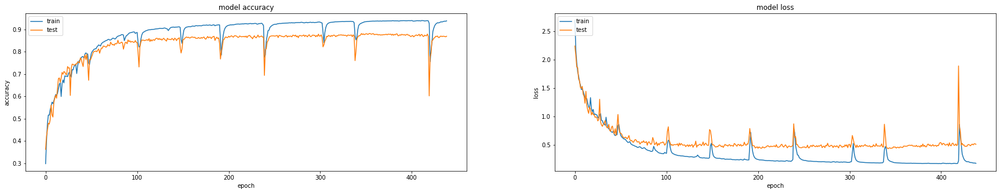

------- partial predictions -------


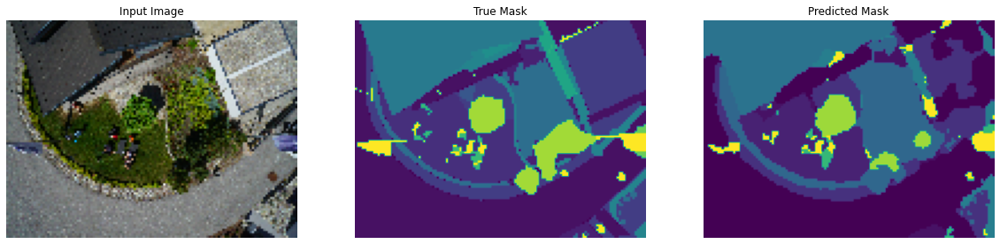

Epoch 441/500
25/25 [==============================] - 1s 43ms/step - loss: 0.1738 - accuracy: 0.9379 - val_loss: 0.5136 - val_accuracy: 0.8716
Epoch 442/500
25/25 [==============================] - 1s 44ms/step - loss: 0.1730 - accuracy: 0.9382 - val_loss: 0.4997 - val_accuracy: 0.8725
Epoch 443/500
25/25 [==============================] - 1s 43ms/step - loss: 0.1709 - accuracy: 0.9389 - val_loss: 0.5048 - val_accuracy: 0.8718
Epoch 444/500
25/25 [==============================] - 1s 43ms/step - loss: 0.1706 - accuracy: 0.9390 - val_loss: 0.5161 - val_accuracy: 0.8700
Epoch 445/500
25/25 [==============================] - 1s 43ms/step - loss: 0.1690 - accuracy: 0.9395 - val_loss: 0.4926 - val_accuracy: 0.8733
Epoch 446/500
25/25 [==============================] - 1s 43ms/step - loss: 0.1679 - accuracy: 0.9398 - val_loss: 0.4982 - val_accuracy: 0.8725
Epoch 447/500
25/25 [==============================] - 1s 43ms/step - loss: 0.1675 - accuracy: 0.9401 - val_loss: 0.5074 - val_accuracy:

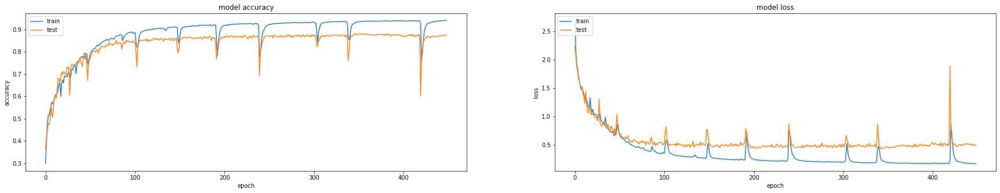

------- partial predictions -------


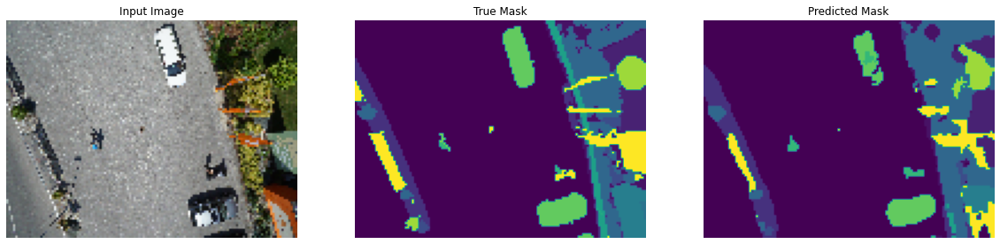

Epoch 451/500
25/25 [==============================] - 1s 43ms/step - loss: 0.1678 - accuracy: 0.9398 - val_loss: 0.4829 - val_accuracy: 0.8734
Epoch 452/500
25/25 [==============================] - 1s 43ms/step - loss: 0.1673 - accuracy: 0.9399 - val_loss: 0.5145 - val_accuracy: 0.8691
Epoch 453/500
25/25 [==============================] - 1s 43ms/step - loss: 0.1662 - accuracy: 0.9404 - val_loss: 0.5126 - val_accuracy: 0.8709
Epoch 454/500
25/25 [==============================] - 1s 44ms/step - loss: 0.1673 - accuracy: 0.9399 - val_loss: 0.5126 - val_accuracy: 0.8744
Epoch 455/500
25/25 [==============================] - 1s 43ms/step - loss: 0.1662 - accuracy: 0.9402 - val_loss: 0.5239 - val_accuracy: 0.8688
Epoch 456/500
25/25 [==============================] - 1s 43ms/step - loss: 0.1658 - accuracy: 0.9404 - val_loss: 0.5240 - val_accuracy: 0.8734
Epoch 457/500
25/25 [==============================] - 1s 43ms/step - loss: 0.1651 - accuracy: 0.9408 - val_loss: 0.5213 - val_accuracy:

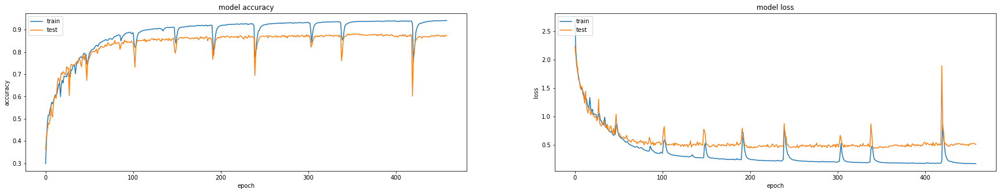

------- partial predictions -------


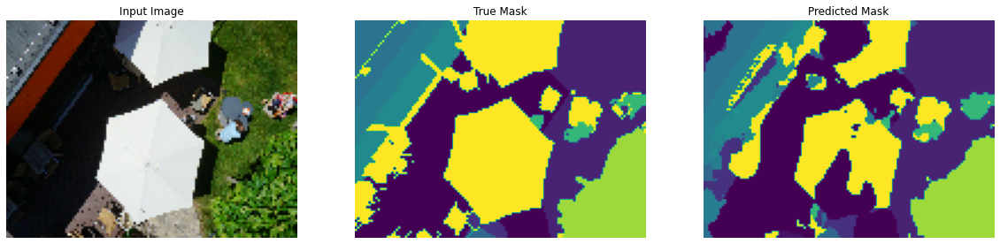

Epoch 461/500
25/25 [==============================] - 1s 43ms/step - loss: 0.1629 - accuracy: 0.9414 - val_loss: 0.5038 - val_accuracy: 0.8735
Epoch 462/500
25/25 [==============================] - 1s 43ms/step - loss: 0.1630 - accuracy: 0.9414 - val_loss: 0.5304 - val_accuracy: 0.8677
Epoch 463/500
25/25 [==============================] - 1s 43ms/step - loss: 0.1621 - accuracy: 0.9417 - val_loss: 0.5213 - val_accuracy: 0.8703
Epoch 464/500
25/25 [==============================] - 1s 43ms/step - loss: 0.1617 - accuracy: 0.9416 - val_loss: 0.5129 - val_accuracy: 0.8712
Epoch 465/500
25/25 [==============================] - 1s 43ms/step - loss: 0.1614 - accuracy: 0.9418 - val_loss: 0.5188 - val_accuracy: 0.8714
Epoch 466/500
25/25 [==============================] - 1s 43ms/step - loss: 0.1614 - accuracy: 0.9419 - val_loss: 0.5253 - val_accuracy: 0.8707
Epoch 467/500
25/25 [==============================] - 1s 43ms/step - loss: 0.1612 - accuracy: 0.9418 - val_loss: 0.5088 - val_accuracy:

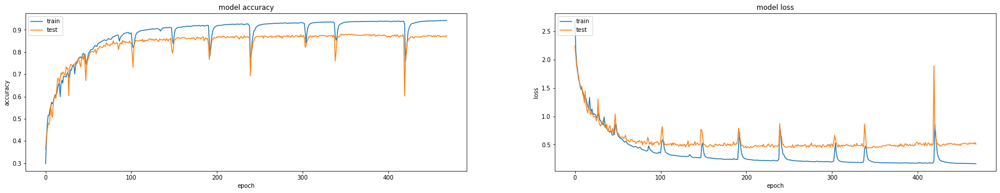

------- partial predictions -------


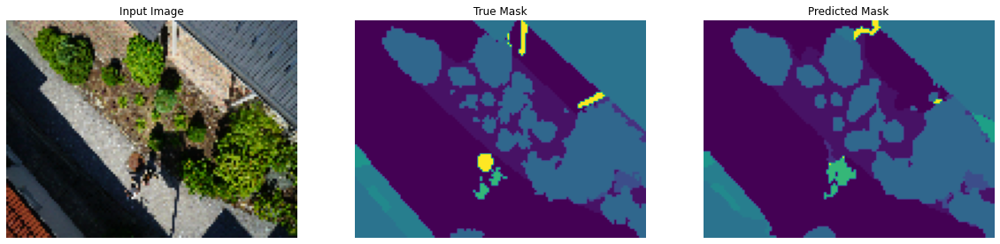

Epoch 471/500
25/25 [==============================] - 1s 43ms/step - loss: 0.1616 - accuracy: 0.9417 - val_loss: 0.5045 - val_accuracy: 0.8739
Epoch 472/500
25/25 [==============================] - 1s 43ms/step - loss: 0.1620 - accuracy: 0.9416 - val_loss: 0.5376 - val_accuracy: 0.8688
Epoch 473/500
25/25 [==============================] - 1s 43ms/step - loss: 0.1624 - accuracy: 0.9415 - val_loss: 0.5451 - val_accuracy: 0.8686
Epoch 474/500
25/25 [==============================] - 1s 43ms/step - loss: 0.1652 - accuracy: 0.9407 - val_loss: 0.5211 - val_accuracy: 0.8695
Epoch 475/500
25/25 [==============================] - 1s 43ms/step - loss: 0.1669 - accuracy: 0.9400 - val_loss: 0.5171 - val_accuracy: 0.8711
Epoch 476/500
25/25 [==============================] - 1s 43ms/step - loss: 0.1640 - accuracy: 0.9408 - val_loss: 0.5276 - val_accuracy: 0.8739
Epoch 477/500
25/25 [==============================] - 1s 43ms/step - loss: 0.1749 - accuracy: 0.9379 - val_loss: 0.5547 - val_accuracy:

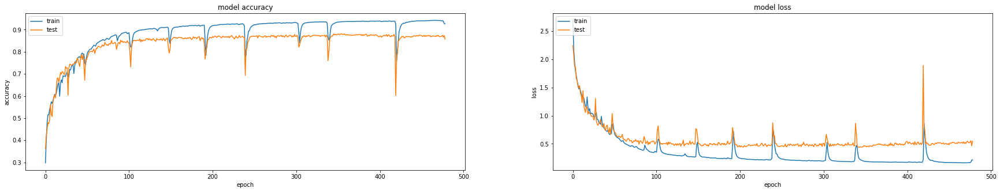

------- partial predictions -------


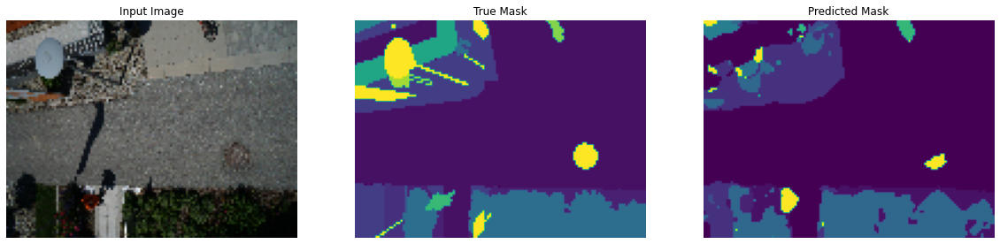

Epoch 481/500
25/25 [==============================] - 1s 43ms/step - loss: 0.1969 - accuracy: 0.9307 - val_loss: 0.4978 - val_accuracy: 0.8699
Epoch 482/500
25/25 [==============================] - 1s 43ms/step - loss: 0.1836 - accuracy: 0.9350 - val_loss: 0.4868 - val_accuracy: 0.8735
Epoch 483/500
25/25 [==============================] - 1s 43ms/step - loss: 0.1752 - accuracy: 0.9375 - val_loss: 0.4887 - val_accuracy: 0.8738
Epoch 484/500
25/25 [==============================] - 1s 45ms/step - loss: 0.1689 - accuracy: 0.9395 - val_loss: 0.5023 - val_accuracy: 0.8715
Epoch 485/500
25/25 [==============================] - 1s 43ms/step - loss: 0.1643 - accuracy: 0.9410 - val_loss: 0.5000 - val_accuracy: 0.8741
Epoch 486/500
25/25 [==============================] - 1s 43ms/step - loss: 0.1624 - accuracy: 0.9414 - val_loss: 0.5102 - val_accuracy: 0.8728
Epoch 487/500
25/25 [==============================] - 1s 43ms/step - loss: 0.1601 - accuracy: 0.9421 - val_loss: 0.4879 - val_accuracy:

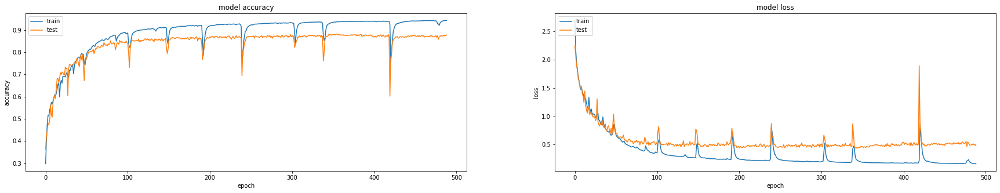

------- partial predictions -------


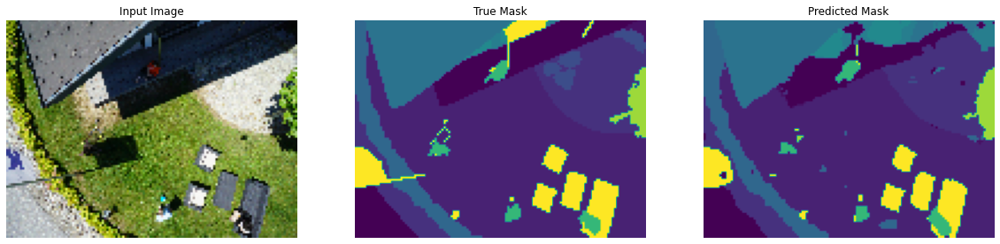

Epoch 491/500
25/25 [==============================] - 1s 43ms/step - loss: 0.1610 - accuracy: 0.9418 - val_loss: 0.5164 - val_accuracy: 0.8754
Epoch 492/500
25/25 [==============================] - 1s 43ms/step - loss: 0.1603 - accuracy: 0.9422 - val_loss: 0.5111 - val_accuracy: 0.8742
Epoch 493/500
25/25 [==============================] - 1s 43ms/step - loss: 0.1588 - accuracy: 0.9426 - val_loss: 0.5247 - val_accuracy: 0.8727
Epoch 494/500
25/25 [==============================] - 1s 43ms/step - loss: 0.1585 - accuracy: 0.9427 - val_loss: 0.5072 - val_accuracy: 0.8716
Epoch 495/500
25/25 [==============================] - 1s 43ms/step - loss: 0.1583 - accuracy: 0.9426 - val_loss: 0.5007 - val_accuracy: 0.8749
Epoch 496/500
25/25 [==============================] - 1s 43ms/step - loss: 0.1580 - accuracy: 0.9429 - val_loss: 0.5099 - val_accuracy: 0.8743
Epoch 497/500
25/25 [==============================] - 1s 43ms/step - loss: 0.1576 - accuracy: 0.9429 - val_loss: 0.5221 - val_accuracy:

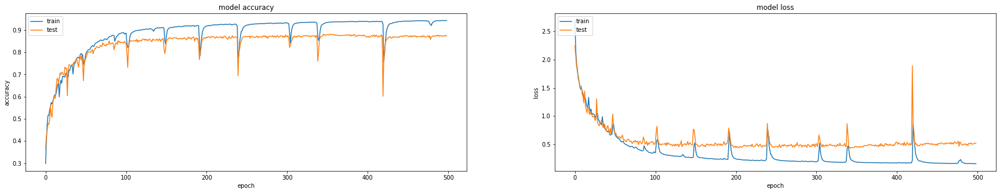

------- partial predictions -------


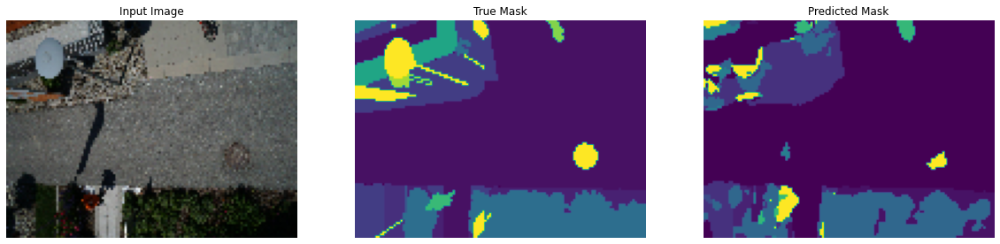

In [25]:
EPOCHS = 500
VAL_SUBSPLITS = 5
BUFFER_SIZE = 390
BATCH_SIZE = 16

# train
train_processed_image_ds.batch(BATCH_SIZE)
train_dataset = train_processed_image_ds.cache().shuffle(BUFFER_SIZE).batch(BATCH_SIZE)
# print(train_processed_image_ds.element_spec)

# validation
validation_processed_image_ds.batch(BATCH_SIZE)
validation_dataset = validation_processed_image_ds.cache().shuffle(BUFFER_SIZE).batch(BATCH_SIZE)
# print(validation_processed_image_ds.element_spec)
 
# callbacks_list = [model_checkpoint_callback, early_stop, DisplayCallback()]
# callbacks_list = [DisplayCallback(unet), lr_callback, early_stop, model_checkpoint_callback]
callbacks_list = [DisplayCallback(unet), model_checkpoint_callback]

model_history = unet.fit(
    train_dataset,
    validation_data=validation_dataset,
    epochs=EPOCHS,
    callbacks=callbacks_list,
    verbose=1)

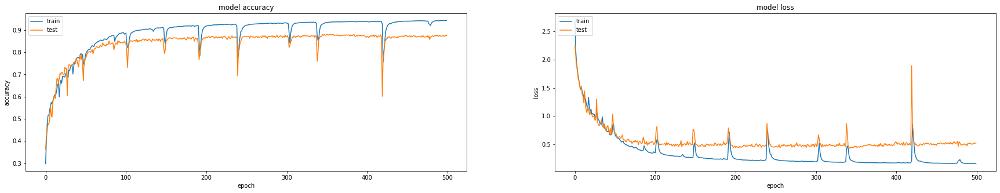

In [26]:
display_learning_curves(model_history)

In [27]:
# model evaluation
print("Unet Model Evaluation: ")
unet.evaluate(validation_dataset)

Unet Model Evaluation: 
1/1 [==============================] - 0s 29ms/step - loss: 0.5241 - accuracy: 0.8754


[0.5241020321846008, 0.8754475712776184]

Salvando o Model Full

In [28]:
unet.save(f"/kaggle/working/{fmtedDateTime}_ModelFull.h5")
    

Salvando o Model History caso seja necessário buscar métricas no futuro

In [29]:
def save_history(history, dest_path):
    with open(dest_path, "wb") as file_hist:
        pickle.dump(history.history, file_hist)

In [30]:
save_history(model_history, f"/kaggle/working/{fmtedDateTime}_ModelHistory.pkl")

In [31]:
print(f"Arquivos gerados nesta seção:")
print(f"Model full: {fmtedDateTime}_ModelFull.h5")
print(f"Model history: {fmtedDateTime}_ModelHistory.pkl")
print(f"Model best weights: {fmtedDateTime}_bestModelWeigths.h5")      

Arquivos gerados nesta seção:
Model full: 20230624094818_ModelFull.h5
Model history: 20230624094818_ModelHistory.pkl
Model best weights: 20230624094818_bestModelWeigths.h5
